# PHILADELPHIA COLLISION DATASET (Coursera Capstone Project)

## Introduction

Vehicular accidents are a leading cause of injuries in the US. In 2018 motor-vehicle crashes accoundted for 39,404 deaths, 4.5 million medically consulted injuries and resulted in injury costs of $445.6 billion dollars. [NTSC Injury Facts](https://injuryfacts.nsc.org/motor-vehicle/overview/introduction/)

According to the ["Vision Zero"](https://www.nsc.org/Portals/0/Documents/DistractedDrivingDocuments/Driver-Tech/Road%20to%20Zero/The-Report.pdf?ver=2018-04-17-111652-263) Plan put together by the NSC, and important  aspect of reducing the severity of accidents is to design roadways in a way to prevent them.

An important aspect of the procedure to reduce the number of accidents is to identify not only the probelmatic areas, but also the additional factors that drive the severity of those accidents.

Identifying those problem areas and factors is an invaluable tool for both city planners and government officials. It also can prove to be a tool for insurance groups to push local governments into action. Nieghborhood groups can substanciate their claims for improvement in their local area. Finally Police and Emergency Response departments can better plan and hopefully reduce the amount of man hours and divert more resources to other causes when collisions are reduced.

## Business Problem
The city of Philadelphia has been implementing the __Vision Zero__ plant discussed above to improve upon the safety of its inhabitants. [They are using data to make smart decisions for city planning and enformcement.](http://visionzerophl.com/uploads/attachments/ck181ipfv1isp9pd66ww0iw0f-file-print-pages-hq-visionzero-y2-update.pdf) 

So the problem to be addressed in this report is can we identify the severity of collisions based on design and situational parameters to help the city of Philadelphia better design roads and traffic to reduce the severity of the vehicular collisions.

## Data Understanding

The dataset for this analysis is a the dataset used for Philadelphia's Vision Zero project. The data is derived form PennDOT's Crash Incident Dataset filtered to 2013-2017. PennDOT's full dataset can be accessed at their [API](https://data.pa.gov/resource/dc5b-gebx.json?), it does not contain data past 2017. The actual dataset for the city of Philadelphia can be found at the [OpenDataPhilly portal](https://www.opendataphilly.org/dataset/vehicular-crash-data). This project uses both the geojson and csv versions of the data.

Additionally for visualization and some spatial investigation this project makes use of the [zipcodes boundaries](https://www.opendataphilly.org/dataset/zip-codes) obtained at OpenDataPhilly. We will also be using the metadata from the same website to idenfity some of the more useful features.

In [1]:
import pandas as pd
import seaborn as sns
import contextily as ctx
import geopandas
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from shapely.geometry import Polygon

In [2]:
collisions=pd.read_csv('Data/crash_data_collision_crash_2013_2017_vz.csv')
col_geo=po_districts=geopandas.read_file("Data/crash_data_collision_crash_2013_2017_vz.geojson")

In [3]:
collisions.head(5)

,objectid,crn,district,county,crash_year,crash_month,day_of_week,time_of_day,hour_of_day,illumination,...,illumination_dark,running_stop_sign,train,trolley,hit_parked_vehicle,mc_drinking_driver,drug_related,illegal_drug_related,drugged_driver,impaired_driver
0,8322,2014125105,6,67,2014,12,2,600,6,3,...,1,0,0,0,0,0,0,0,0,0
1,8238,2014130456,6,67,2014,12,6,41,0,3,...,1,0,0,0,0,0,0,0,0,0
2,8728,2014130560,6,67,2014,12,6,1330,13,1,...,0,0,0,0,0,0,0,0,0,0
3,1,2017028806,6,67,2017,2,5,921,9,1,...,0,0,0,0,0,0,0,0,0,0
4,2,2017041347,6,67,2017,3,5,2210,22,3,...,1,0,0,0,0,0,0,0,0,0


In [4]:
collisions.columns

Index(['objectid', 'crn', 'district', 'county', 'crash_year', 'crash_month',
       'day_of_week', 'time_of_day', 'hour_of_day', 'illumination', 'weather',
       'road_condition', 'collision_type', 'intersect_type', 'tcd_type',
       'location_type', 'fatal_count', 'injury_count', 'person_count',
       'latitude', 'longitude', 'bicycle_count', 'maj_inj_count',
       'mod_inj_count', 'min_inj_count', 'tot_inj_count', 'ped_count',
       'ped_death_count', 'ped_maj_inj_count', 'max_severity_level',
       'injury_or_fatal', 'fatal_or_maj_inj', 'injury', 'fatal', 'sch_bus_ind',
       'automobile_count', 'motorcycle_count', 'bus_count',
       'small_truck_count', 'heavy_truck_count', 'suv_count', 'van_count',
       'comm_veh_count', 'rdwy_surf_type_cd', 'intersection', 'state_road',
       'signalized_int', 'stop_controlled_int', 'hit_deer', 'hit_tree_shrub',
       'hit_embankment', 'hit_pole', 'hit_gdrail', 'hit_gdrail_end',
       'hit_barrier', 'hit_bridge', 'overturned', 'alcoh

In [5]:
col_geo.head(5)

,objectid,crn,district,county,crash_year,crash_month,day_of_week,time_of_day,hour_of_day,illumination,...,running_stop_sign,train,trolley,hit_parked_vehicle,mc_drinking_driver,drug_related,illegal_drug_related,drugged_driver,impaired_driver,geometry
0,8322,2014125105,6,67,2014,12,2,600,6,3,...,0,0,0,0,0,0,0,0,0,POINT (-75.12215 40.05319)
1,8238,2014130456,6,67,2014,12,6,41,0,3,...,0,0,0,0,0,0,0,0,0,POINT (-75.03507 40.07460)
2,8728,2014130560,6,67,2014,12,6,1330,13,1,...,0,0,0,0,0,0,0,0,0,POINT (-75.18808 39.97514)
3,1,2017028806,6,67,2017,2,5,921,9,1,...,0,0,0,0,0,0,0,0,0,POINT (-75.04050 40.03680)
4,2,2017041347,6,67,2017,3,5,2210,22,3,...,0,0,0,0,0,0,0,0,0,POINT (-75.13290 39.99110)


To better correlate and have descriptions of features we import the metadata

In [6]:
metafields=pd.read_csv('Data/fields.csv')
metafields['Field Name']=metafields['Field Name'].str.lower()
display(metafields.head(5))

,Field Name,Alias,Description,Type
0,automobile_count,dataset,Total Amount of Automobiles Involved in crash,Numeric
1,belted_death_count,dataset,Total number of belted occupants killed in crash,Numeric
2,belted_maj_inj_count,dataset,Total number of belted occupants who sustained...,Numeric
3,bicycle_count,dataset,Total number of bicycles involved,Numeric
4,bicycle_death_count,dataset,Total number of bicyclists killed during crash...,Numeric


In [7]:
zipcode_boundaries=geopandas.read_file("Data/Zipcodes_Poly.geojson")

The metadata for the collisions dataset can be found [here](https://metadata.phila.gov/#home/datasetdetails/5543865420583086178c4eba/representationdetails/5c4114cde23cad276ca4245c/?view_287_page=5)

In [8]:
len(collisions.columns)

96

The collision data set contains 96 columns.

In [9]:
collisions.columns

Index(['objectid', 'crn', 'district', 'county', 'crash_year', 'crash_month',
       'day_of_week', 'time_of_day', 'hour_of_day', 'illumination', 'weather',
       'road_condition', 'collision_type', 'intersect_type', 'tcd_type',
       'location_type', 'fatal_count', 'injury_count', 'person_count',
       'latitude', 'longitude', 'bicycle_count', 'maj_inj_count',
       'mod_inj_count', 'min_inj_count', 'tot_inj_count', 'ped_count',
       'ped_death_count', 'ped_maj_inj_count', 'max_severity_level',
       'injury_or_fatal', 'fatal_or_maj_inj', 'injury', 'fatal', 'sch_bus_ind',
       'automobile_count', 'motorcycle_count', 'bus_count',
       'small_truck_count', 'heavy_truck_count', 'suv_count', 'van_count',
       'comm_veh_count', 'rdwy_surf_type_cd', 'intersection', 'state_road',
       'signalized_int', 'stop_controlled_int', 'hit_deer', 'hit_tree_shrub',
       'hit_embankment', 'hit_pole', 'hit_gdrail', 'hit_gdrail_end',
       'hit_barrier', 'hit_bridge', 'overturned', 'alcoh

The target value that our program will attempt to predict is the severity of the collision. This is denoted by MAX_SEVERITY_LEVEL in the dataset 

|MAX_SEVERITY_LEVEL |Maximum injury severity level of the crash |
| - | - |
|0 | Not injured
|1 | Killed
|2 | Major injury
|3 | Moderate injury
|4 | Minor injury
|8 | Injury/ Unknown Severity
|9 | Unknown

In order to determine what features/ columns to a count of the unique values per feature is performed. Features with low counts are also presented. From this approach it is clear which columns can be safetly left out of the investigation (for example `county` and `district`).

In [10]:
col_values=[]
for col in collisions.columns:
    num_values=len(collisions[col].unique())
    col_values.append([col,num_values])
col_df=pd.DataFrame(col_values,columns=['column','values'])
col_df.head()
for i in range(1,5):
    print('Number of distinct values: '+str(i))
    display(col_df[col_df.values==i].sort_values('column'))

Number of distinct values: 1


,column,values
3,county,1
2,district,1
67,limit_65mph,1


Number of distinct values: 2


,column,values
70,aggressive_driving,2
57,alcohol_related,2
61,cell_phone,2
82,comm_vehicle,2
64,cross_median,2
66,curve_dvr_error,2
65,curved_road,2
85,deer_related,2
60,distracted,2
58,drinking_driver,2


Number of distinct values: 3


,column,values
21,bicycle_count,3
37,bus_count,3
39,heavy_truck_count,3


Number of distinct values: 4


,column,values
42,comm_veh_count,4
36,motorcycle_count,4
27,ped_death_count,4
28,ped_maj_inj_count,4
43,rdwy_surf_type_cd,4
34,sch_bus_ind,4
38,small_truck_count,4
41,van_count,4


From the previous counts we can also determine that quite a lot of columns are descriptive of the incident outcome and not the conditions (which are more interesting for planning). These can be identified by the prefixes, for example `hit` and `count`.

In [11]:
col_df.sort_values('values',ascending=False).head(5)

,column,values
0,objectid,46863
1,crn,46863
20,longitude,7370
19,latitude,7352
7,time_of_day,1441


As far as the values from the largest counts `objectid` and `crn` seem to be identifiers and as such only require one of them.



Since the dataset contains columns not explained in the metadata we want to identify why the diference.

In [12]:
undescribed_cols_CSV = np.setdiff1d(collisions.columns,metafields['Field Name'])
undescribed_cols_CSV

array(['aggressive_driving', 'alcohol_related', 'cell_phone',
       'collision_type', 'comm_vehicle', 'county', 'cross_median',
       'curve_dvr_error', 'curved_road', 'deer_related', 'distracted',
       'district', 'drinking_driver', 'driver_count_16yr',
       'driver_count_17yr', 'driver_count_18yr', 'driver_count_19yr',
       'driver_count_20yr', 'driver_count_50_64yr',
       'driver_count_65_74yr', 'driver_count_75plus', 'drug_related',
       'drugged_driver', 'fatal', 'fatal_or_maj_inj', 'fatigue_asleep',
       'hit_barrier', 'hit_bridge', 'hit_deer', 'hit_embankment',
       'hit_gdrail', 'hit_gdrail_end', 'hit_parked_vehicle', 'hit_pole',
       'hit_tree_shrub', 'illegal_drug_related', 'illumination_dark',
       'impaired_driver', 'injury', 'injury_or_fatal', 'latitude',
       'limit_65mph', 'location_type', 'longitude', 'mc_drinking_driver',
       'nhtsa_agg_driving', 'objectid', 'overturned', 'pedestrian',
       'psp_reported', 'rdwy_surf_type_cd', 'running_red_lt

The fields identified as descriptive of the accident outcome seem to the majority of the extra fields not contained in the metadata

In [13]:
undescribed_cols_META = np.setdiff1d(metafields['Field Name'],collisions.columns)
undescribed_cols_META

array(['belted_death_count', 'belted_maj_inj_count',
       'bicycle_death_count', 'bicycle_maj_inj_count',
       'mcycle_death_count', 'mcycle_maj_inj_count', 'sch_zone_ind',
       'unb_death_count', 'unb_maj_inj_count', 'unk_inj_deg_count',
       'unk_inj_per_count', 'vehicle_count'], dtype=object)

We create a dataframe of only existing fields

In [14]:
efields=metafields[~metafields['Field Name'].isin(undescribed_cols_META)]
efields

,Field Name,Alias,Description,Type
0,automobile_count,dataset,Total Amount of Automobiles Involved in crash,Numeric
3,bicycle_count,dataset,Total number of bicycles involved,Numeric
6,bus_count,dataset,Total number of buses involved,Numeric
7,comm_veh_count,dataset,Total number of commercial vehicles involved i...,Numeric
8,crash_month,dataset,Month when the crash occurred,Text
9,crash_year,dataset,Year in which the crash occurred.,Text
10,crn,dataset,Crash record number - unique identifier for ea...,Numeric
11,day_of_week,dataset,Day of the Week code when crash occurred-<br /...,Text
12,fatal_count,dataset,Total number of fatalities involved,Numeric
13,heavy_truck_count,dataset,Total number of heavy trucks involved in crash,Numeric


Quick correlation matrix

In [15]:
corr = collisions[efields['Field Name']].corr()
corr.style.background_gradient(cmap='coolwarm')

,automobile_count,bicycle_count,bus_count,comm_veh_count,crash_month,crash_year,crn,day_of_week,fatal_count,heavy_truck_count,hour_of_day,illumination,injury_count,intersect_type,intersection,maj_inj_count,max_severity_level,min_inj_count,mod_inj_count,motorcycle_count,ped_count,ped_death_count,ped_maj_inj_count,person_count,road_condition,small_truck_count,suv_count,tcd_type,time_of_day,unbelted_occ_count,van_count
automobile_count,1.000000,-0.143088,-0.096694,-0.136759,-0.013179,0.049462,0.049311,0.000909,-0.036213,-0.097145,-0.001427,0.017199,0.048541,0.025390,0.042169,-0.026290,-0.045017,0.046656,-0.024983,-0.114706,-0.265840,-0.032719,-0.049158,0.156169,-0.016640,-0.168534,-0.314758,0.071835,-0.001321,0.031306,-0.182177
bicycle_count,-0.143088,1.000000,-0.016798,-0.028494,0.037701,-0.022885,-0.026510,0.003053,-0.006974,-0.021205,0.014885,-0.038335,-0.014753,0.017145,0.031110,0.002992,0.051063,0.002945,0.017724,-0.026544,-0.104043,-0.013370,-0.020418,-0.061490,-0.038980,-0.028766,-0.073796,0.019923,0.014679,0.006772,-0.035165
bus_count,-0.096694,-0.016798,1.000000,0.675674,0.006028,0.005269,0.004918,0.002397,0.019168,-0.003740,-0.005956,-0.046360,0.108940,-0.000825,0.005656,-0.003724,0.023821,0.074081,-0.001102,-0.017601,-0.016628,0.015634,-0.001551,0.231196,-0.002717,-0.018996,-0.056144,0.005300,-0.005886,-0.000470,-0.021309
comm_veh_count,-0.136759,-0.028494,0.675674,1.000000,0.003237,0.009488,0.009051,0.001868,0.019909,0.662993,-0.011649,-0.064494,0.060374,-0.010825,-0.012012,0.003025,-0.001143,0.038883,-0.006686,-0.024056,-0.044058,0.009060,-0.002698,0.154855,-0.001601,-0.024625,-0.071918,-0.012071,-0.011559,0.005787,-0.031216
crash_month,-0.013179,0.037701,0.006028,0.003237,1.000000,-0.008943,0.084221,0.005646,0.010069,0.003856,-0.005433,0.034092,-0.006072,0.004255,0.014296,-0.002441,0.003820,-0.002298,-0.005006,0.009317,0.004799,0.009934,0.000199,-0.006348,-0.088207,-0.017775,0.008649,0.008281,-0.005480,0.030693,-0.000172
crash_year,0.049462,-0.022885,0.005269,0.009488,-0.008943,1.000000,0.983878,-0.013382,0.000149,0.017088,-0.064339,0.009637,-0.003537,0.002354,-0.331179,0.003522,0.007381,-0.012319,0.016863,0.000686,-0.013435,0.001910,0.005676,-0.005750,-0.021634,-0.047566,0.137815,0.005629,-0.064318,0.195392,0.035756
crn,0.049311,-0.026510,0.004918,0.009051,0.084221,0.983878,1.000000,-0.011720,0.001548,0.016862,-0.064516,0.021353,-0.005230,0.003321,-0.327962,0.005167,0.008884,-0.016503,0.018347,-0.003458,-0.013130,0.003491,0.005941,-0.007672,-0.012993,-0.047326,0.136039,0.006386,-0.064498,0.191899,0.033278
day_of_week,0.000909,0.003053,0.002397,0.001868,0.005646,-0.013382,-0.011720,1.000000,-0.005084,-0.000895,0.014850,0.007923,-0.002413,0.004034,0.006109,-0.005805,-0.002237,0.005433,-0.000162,-0.004416,0.005420,0.004023,-0.000060,0.006279,-0.009606,0.007821,0.001172,0.001875,0.014730,-0.007035,-0.006218
fatal_count,-0.036213,-0.006974,0.019168,0.019909,0.010069,0.000149,0.001548,-0.005084,1.000000,-0.000479,-0.014120,0.032116,-0.029580,-0.015408,-0.018906,0.039011,-0.097845,-0.034042,-0.004186,0.071787,0.074918,0.649488,-0.000513,0.017411,-0.009289,-0.009684,-0.013794,-0.027567,-0.014044,-0.003044,-0.001679
heavy_truck_count,-0.097145,-0.021205,-0.003740,0.662993,0.003856,0.017088,0.016862,-0.000895,-0.000479,1.000000,-0.005258,-0.047886,-0.016680,-0.008477,-0.015293,0.003963,-0.021303,-0.013988,-0.007473,-0.016565,-0.042129,-0.002168,-0.003695,0.009146,-0.000299,-0.025206,-0.045972,-0.013025,-0.005212,0.009607,-0.025228


From this investigation the initial feature selection to determine was selected to be as follows, including the target value `max_severity_level`.

In [16]:
features=['crash_month',
 'crash_year',
 'crn',
 'day_of_week',
 'hour_of_day',
 'illumination',
 'intersect_type',
 'intersection',
 'max_severity_level',
 'tcd_type',
 'road_condition']

In [17]:
collision_data=collisions[features]
collision_data.head(5)

,crash_month,crash_year,crn,day_of_week,hour_of_day,illumination,intersect_type,intersection,max_severity_level,tcd_type,road_condition
0,12,2014,2014125105,2,6,3,5,1,4,2,0
1,12,2014,2014130456,6,0,3,1,1,0,2,0
2,12,2014,2014130560,6,13,1,1,1,8,2,0
3,2,2017,2017028806,5,9,1,5,0,4,2,1
4,3,2017,2017041347,5,22,3,1,0,4,2,1


Since we will be using supervised learning in our initial approach we want to observe our target variable `max_severity_level` and its counts.

In [18]:
collisions.max_severity_level.value_counts().to_frame()

,max_severity_level
4,18011
8,11637
0,9243
3,5001
9,1537
2,1042
1,392


In [19]:
sl_map={0:'Not injured',
1:'Killed',
2:'Major injury',
3:'Moderate injury',
4:'Minor injury',
8:'Injury/ Unknown Severity',
9:'Unknown'}

sl_str_map={'0':'Not injured',
'1':'Killed',
'2':'Major injury',
'3':'Moderate injury',
'4':'Minor injury',
'8':'Injury/ Unknown Severity',
'9':'Unknown'}

collisions['sl_desc']=collisions.max_severity_level.map(sl_map)

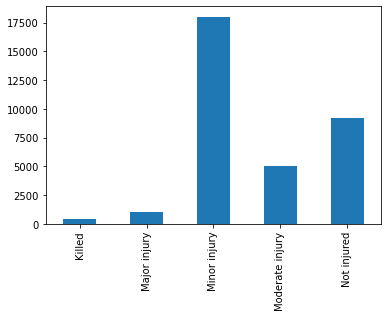

In [176]:
collisions.sl_desc.value_counts().to_frame().sort_index().plot.bar(legend='False');
plt.gca().get_legend().remove()

As expected we have an inbalanced dataset (which is expected since we would expect fatalities to be in the minority of outcomes). We will need to oversample or perform synthetic minority oversampling to help improve the accuracy 

We also decide to remove target values for which the `max_severity_level` is either 8 or 9 as these are used for incomplete data. (either unknown severity, or unknown injury)

In [21]:
collisions=collisions[~collisions.max_severity_level.isin([8,9])]

<AxesSubplot:>

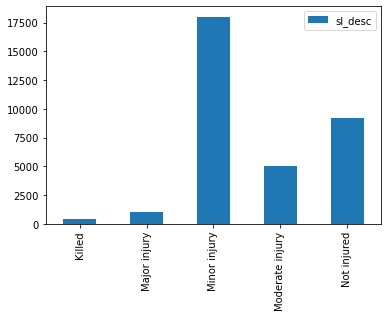

In [22]:
collisions.sl_desc.value_counts().to_frame().sort_index().plot(kind='bar')

Since we want to also determine if there is any particular spatial relationships to the collision outcomes we perform the same process on the geojson data but keep the geometry parameter

In [23]:
data_geo=col_geo[features+['geometry']]
data_geo=data_geo[~data_geo.max_severity_level.isin([8,9])]
data_geo['sl_desc']=data_geo.max_severity_level.map(sl_map)

In [24]:
features

['crash_month',
 'crash_year',
 'crn',
 'day_of_week',
 'hour_of_day',
 'illumination',
 'intersect_type',
 'intersection',
 'max_severity_level',
 'tcd_type',
 'road_condition']

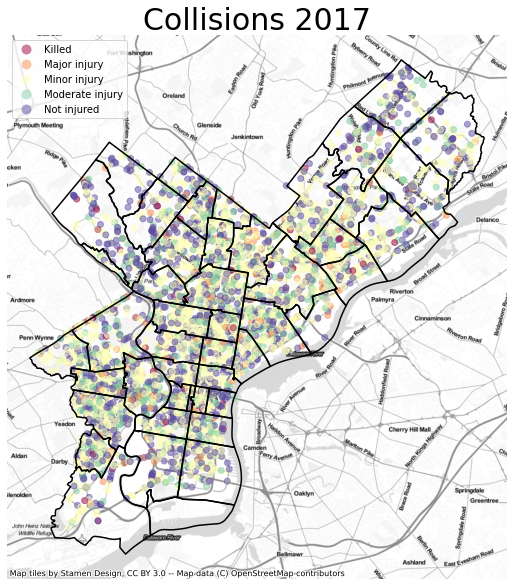

In [25]:
fig, ax = plt.subplots(1, 1,figsize=(10,10))
data_geo[data_geo.crash_year==2017] \
.to_crs(epsg=3857) \
.plot(ax=ax,column='sl_desc',categorical=True, cmap='Spectral', alpha=0.5, legend=True)

zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
ax.set_title('Collisions 2017',fontsize='30');

From the illustration above, it appears that location might have some influence over the outcome of the result. To better model this, we include the zipcode into the dataset.

In [26]:
data_geo=geopandas.sjoin(data_geo, zipcode_boundaries[['CODE','geometry']], how='inner',op='within')

In [27]:
data_geo.head(5)

,crash_month,crash_year,crn,day_of_week,hour_of_day,illumination,intersect_type,intersection,max_severity_level,tcd_type,road_condition,geometry,sl_desc,index_right,CODE
1,12,2014,2014130456,6,0,3,1,1,0,2,0,POINT (-75.03507 40.07460),Not injured,25,19152
178,5,2017,2017060507,1,1,3,0,0,0,0,0,POINT (-75.05550 40.06150),Not injured,25,19152
299,4,2017,2017043828,2,19,1,2,0,4,0,0,POINT (-75.05220 40.04460),Minor injury,25,19152
386,3,2017,2017035663,3,12,1,0,0,0,0,4,POINT (-75.05100 40.04800),Not injured,25,19152
478,1,2017,2017013193,6,17,3,1,0,4,2,0,POINT (-75.06080 40.05670),Minor injury,25,19152


## Data Exploration

First we look at the seasonality of the collisions

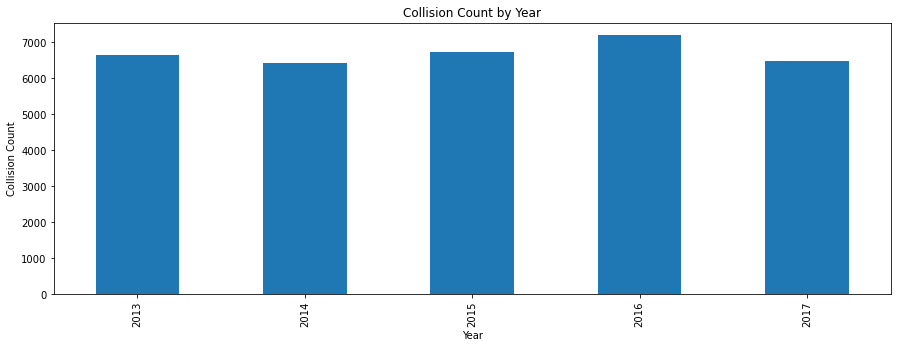

In [28]:
fig, ax = plt.subplots(1, 1,figsize=(15,5))
data_geo.groupby(['crash_year']).crn.count().plot(kind='bar',ax=ax)
ax.set_xlabel('Year')
ax.set_ylabel('Collision Count')
ax.set_title('Collision Count by Year');

It is interesting to note that there doesn't seem to be much of an improvement in terms of number of collisions. Perhaps this could be attributed to an increase in population so it is something to be considered in further analysis.

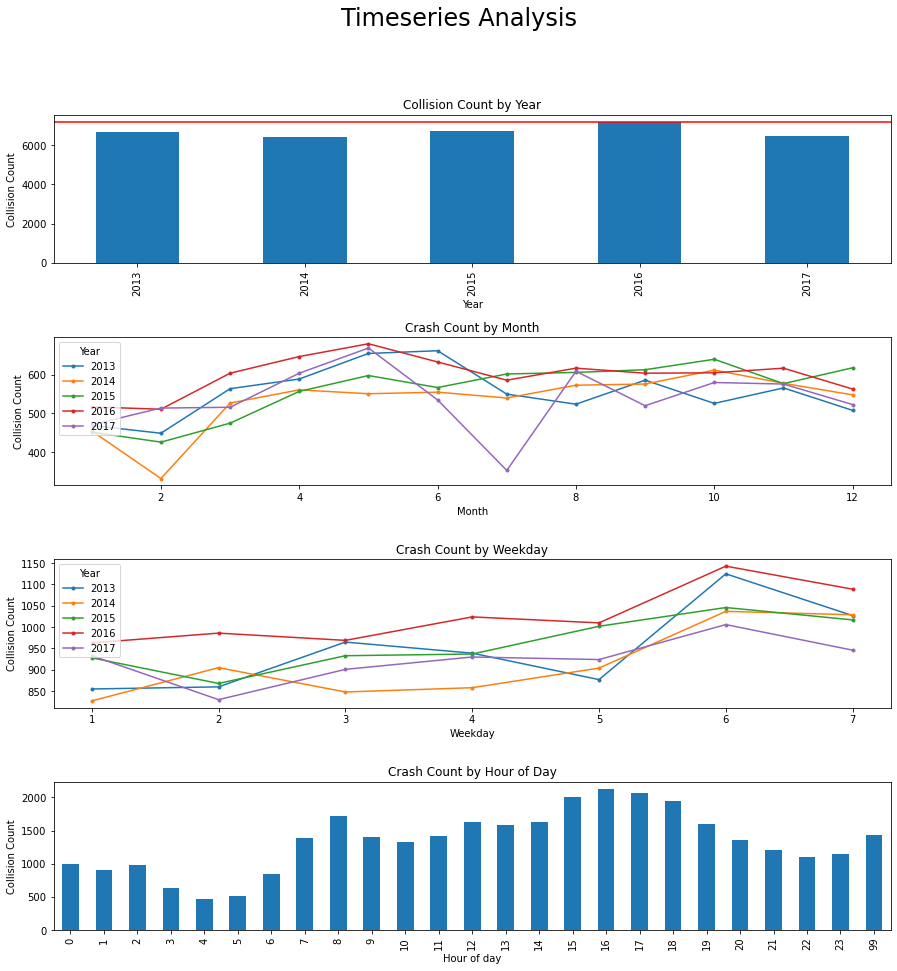

In [183]:
fig, axs = plt.subplots(4, 1,figsize=(15,15))

data_geo.groupby(['crash_year']).crn.count().plot(kind='bar',ax=axs[0])
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Collision Count')
axs[0].set_title('Collision Count by Year');
axs[0].axhline(data_geo.groupby(['crash_year']).crn.count().max(),color='r')


data_geo.groupby(['crash_month','crash_year']).crn.count().unstack().plot(marker='.',ax=axs[1])

axs[1].set_title('Crash Count by Month')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Collision Count')

data_geo.groupby(['day_of_week','crash_year']).crn.count().unstack().plot(marker='.',ax=axs[2])
axs[2].set_title('Crash Count by Weekday')
axs[2].set_xlabel('Weekday')
axs[2].set_ylabel('Collision Count')

data_geo.groupby(['hour_of_day']).crn.count().plot(kind='bar',ax=axs[3])
axs[3].set_title('Crash Count by Hour of Day')
axs[3].set_xlabel('Hour of day')
axs[3].set_ylabel('Collision Count')


fig.suptitle('Timeseries Analysis', fontsize=24);
axs[1].legend(loc='upper left').set_title('Year')
axs[2].legend(loc='upper left').set_title('Year')

fig.subplots_adjust(hspace=0.5)

From the Monthly plot we can see some interesting trends, there is an increase towards the summer and then tapering off at the end. There seems to be quite a dip between December and January. There are a copuple of outliers. Mainly 2014,2 and 2017,7 with a singificantly reduced amount of collisions. 

From the weekday plot it makes common sense, increse in accidents on the weekends (6,7) it is important to see that there has been a reduction in incidents on the weekend to 2017. However as seen previously this is not the case for 2016 which had an overall increase.

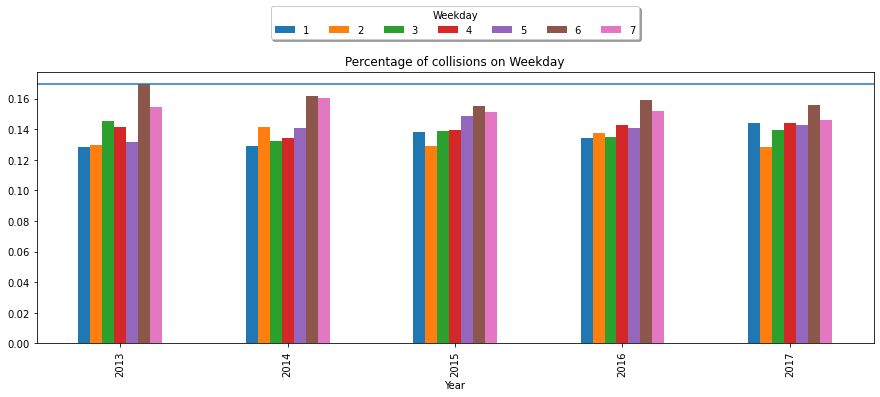

In [30]:
fig, ax = plt.subplots(1, 1,figsize=(15,5))
wf=data_geo.groupby(['day_of_week','crash_year']).crn.count().unstack().transpose()
wf.div(wf.sum(axis=1), axis=0).plot(kind='bar',ax=ax)
ax.legend(loc='lower center', bbox_to_anchor=(0.5, 1.1), ncol=7, title='Weekday', shadow=True);
ax.set_title('Percentage of collisions on Weekday')
ax.set_xlabel('Year');
maxv=wf.div(wf.sum(axis=1), axis=0).max().max();
ax.axhline(maxv);

From looking at percentages of collisions over the day of week there appears to be a slight reduction on weekend crashes (as a percentage of the total)

In [31]:
fatalities=data_geo[data_geo.max_severity_level==1]

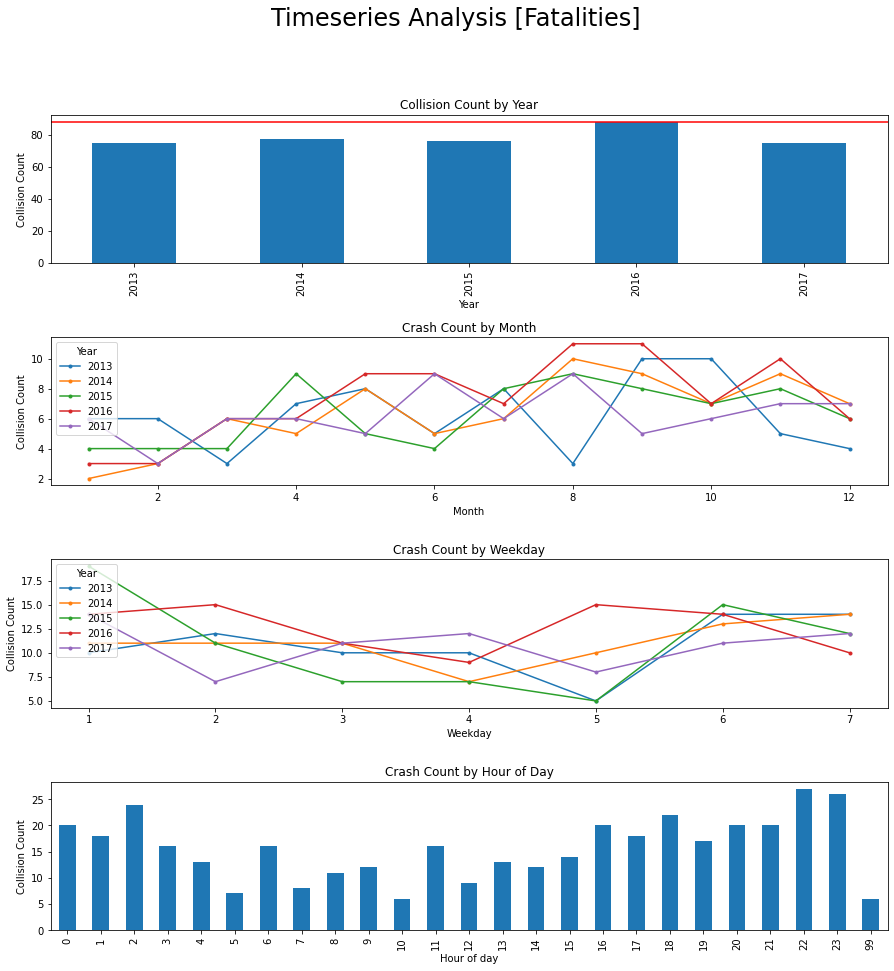

In [182]:
fig, axs = plt.subplots(4, 1,figsize=(15,15))

fatalities.groupby(['crash_year']).crn.count().plot(kind='bar',ax=axs[0])
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Collision Count')
axs[0].set_title('Collision Count by Year');
axs[0].axhline(fatalities.groupby(['crash_year']).crn.count().max(),color='r')


fatalities.groupby(['crash_month','crash_year']).crn.count().unstack().plot(marker='.',ax=axs[1])

axs[1].set_title('Crash Count by Month')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Collision Count')

fatalities.groupby(['day_of_week','crash_year']).crn.count().unstack().plot(marker='.',ax=axs[2])
axs[2].set_title('Crash Count by Weekday')
axs[2].set_xlabel('Weekday')
axs[2].set_ylabel('Collision Count')

fatalities.groupby(['hour_of_day']).crn.count().plot(kind='bar',ax=axs[3])
axs[3].set_title('Crash Count by Hour of Day')
axs[3].set_xlabel('Hour of day')
axs[3].set_ylabel('Collision Count')

fig.suptitle('Timeseries Analysis [Fatalities]', fontsize=24);
axs[1].legend(loc='upper left').set_title('Year')
axs[2].legend(loc='upper left').set_title('Year')

fig.subplots_adjust(hspace=0.5)

The fatality trends seem to be quite similar to the overall, however it does appear that there have some improvement on overall numver of fatalities in December.

In [33]:
sl_year=data_geo.groupby(['crash_year','max_severity_level']).crn.count().unstack().transpose()
sl_year.transpose()

max_severity_level,0,1,2,3,4
crash_year,,,,,
2013,1791,75,190,917,3675
2014,1731,77,194,932,3474
2015,1896,76,217,966,3576
2016,1965,88,220,1174,3737
2017,1762,75,213,981,3439


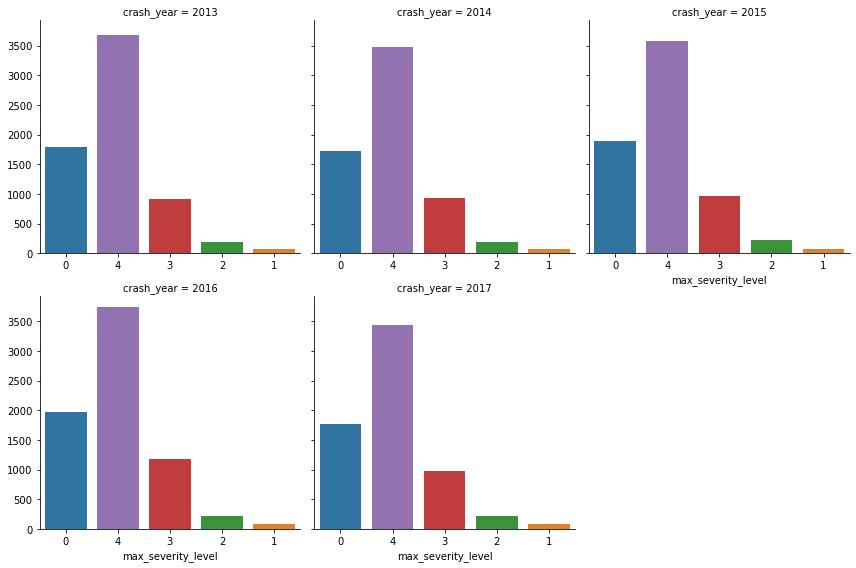

In [196]:
g=sns.FacetGrid(data_geo,col="crash_year", col_wrap=3, sharex=False, height=4, hue="max_severity_level")
g.map(sns.countplot,"max_severity_level",order=[0,4,3,2,1]);

In terms of the distribution of the severity of the collisions, the pattern does not seem to change from year to year

In [198]:
illumination_map={1 : 'Daylight',
2 : 'Dark - no street lights',
3 : 'Dark -  street lights',
4 : 'Dusk',
5 : 'Dawn',
6 : 'Dark-unknown roadway lighting',
8 : 'Other',
9 : 'Unknown (expired)'}
data_geo['il_desc']=data_geo.illumination.map(illumination_map)
illumination=data_geo.illumination.value_counts().to_frame()
illumination.index=illumination.index.map(illumination_map)


|                               |   illumination |
|:------------------------------|---------------:|
| Daylight                      |          20501 |
| Dark -  street lights         |          11346 |
| Dusk                          |            687 |
| Dark - no street lights       |            397 |
| Dawn                          |            311 |
| Dark-unknown roadway lighting |            148 |
| Other                         |             51 |


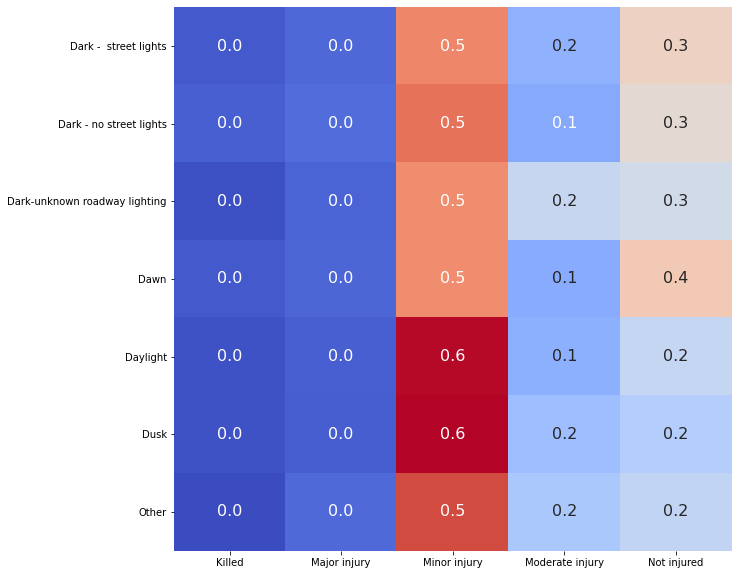

In [211]:
fig, ax = plt.subplots(figsize=(10,10))   
ils_df=data_geo.groupby(['il_desc','sl_desc']).crn.count().unstack().fillna(0).apply(lambda x: x/x.sum(), axis=1)
p = sns.heatmap(ils_df,
                cmap='coolwarm',
                annot=True,
                fmt=".1f",
                annot_kws={'size':16},
                cbar=False, ax=ax)
ax.set_ylabel('');    
ax.set_xlabel('');


In [261]:
ill_f=data_geo[data_geo['sl_desc']=='Killed'].groupby(['il_desc']).crn.count()
ill_f

il_desc
Dark -  street lights            209
Dark - no street lights           10
Dark-unknown roadway lighting      1
Dawn                               6
Daylight                         159
Dusk                               6
Name: crn, dtype: int64

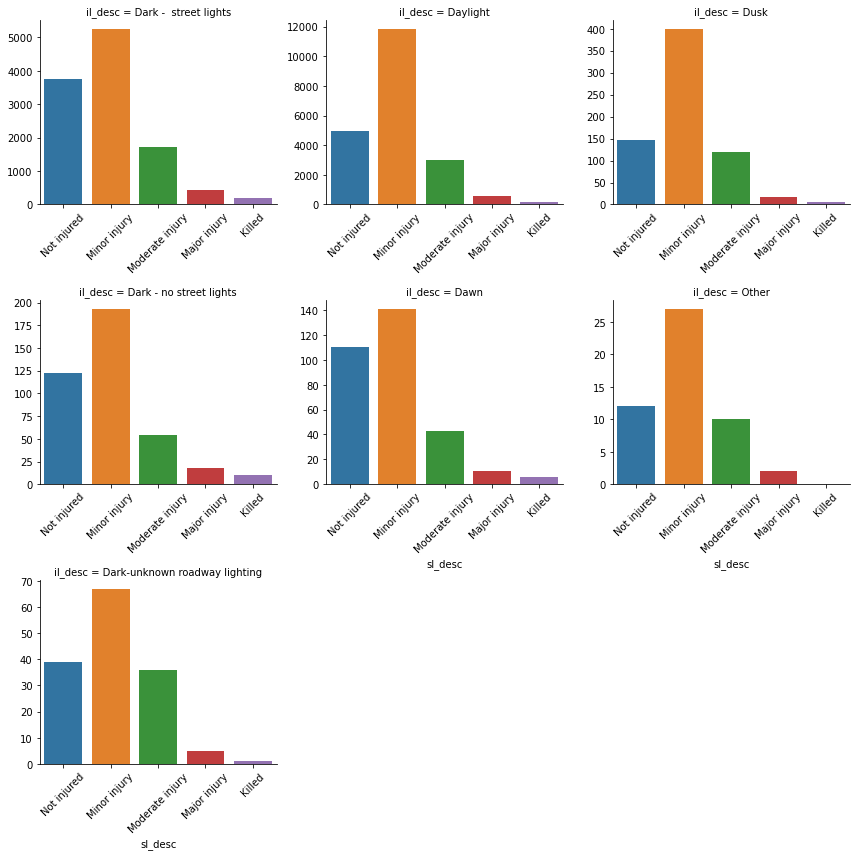

In [36]:
g=sns.FacetGrid(data_geo,col="il_desc", col_wrap=3, sharex=False, sharey=False, height=4, hue="sl_desc")
g.map(sns.countplot,"sl_desc",order=['Not injured','Minor injury','Moderate injury','Major injury','Killed']);
for ax in g.axes:
    for label in ax.get_xticklabels():
        label.set_rotation(45)
g.tight_layout()

For illumination we probably we can see that there is a majority of crashes occuring in daylight, followed by Dark but with street lights. Also the number of fatalities and major injuries does not seem to increase.

Now we investigate the _intersection_ feature

In [37]:
data_geo['intersection'].value_counts()

0    17482
1    15959
Name: intersection, dtype: int64

The `intersect_type` gives us the type of intersection at which the collision occured

In [38]:
intersect_map={0:'Mid-block',
1:'Four way intersection',
2:'T intersection',
3:'Y intersection',
4:'Traffic circle or Round About',
5:'Multi-leg intersection',
6:'On ramp',
7:'Off ramp',
8:'Crossover',
9:'Railroad crossing',
10:'Other',
99:'Unknown (expired)'}
intersect=data_geo['intersect_type'].value_counts(dropna=False).to_frame()
intersect['desc']=intersect.index.map(intersect_map)
display(intersect)
print(intersect.intersect_type.sum())

,intersect_type,desc
1,14983,Four way intersection
0,13600,Mid-block
2,3342,T intersection
5,740,Multi-leg intersection
3,557,Y intersection
6,82,On ramp
4,47,Traffic circle or Round About
10,44,Other
7,40,Off ramp
9,5,Railroad crossing


33441


In [237]:
print(intersect.set_index('desc').to_markdown())

| desc                          |   intersect_type |
|:------------------------------|-----------------:|
| Four way intersection         |            14983 |
| Mid-block                     |            13600 |
| T intersection                |             3342 |
| Multi-leg intersection        |              740 |
| Y intersection                |              557 |
| On ramp                       |               82 |
| Traffic circle or Round About |               47 |
| Other                         |               44 |
| Off ramp                      |               40 |
| Railroad crossing             |                5 |
| nan                           |                1 |


In [39]:
data_geo['intersect_desc']=data_geo['intersect_type'].map(intersect_map)

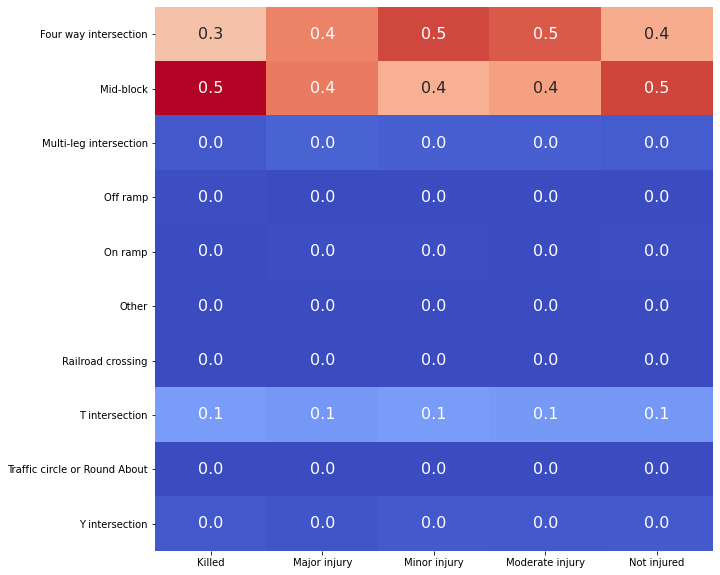

In [242]:
fig, ax = plt.subplots(figsize=(10,10))   
intt_df=data_geo.groupby(['intersect_desc','sl_desc']).crn.count().unstack().fillna(0).apply(lambda x: x/x.sum(), axis=0)
p = sns.heatmap(intt_df,
                cmap='coolwarm',
                annot=True,
                fmt=".1f",
                annot_kws={'size':16},
                cbar=False, ax=ax)
ax.set_ylabel('');    
ax.set_xlabel('');

As expected most collisions happend at four way intersections, but there is also a significant ammount mid-block.
As a sanity check we want to make sure that there are no values that are listed as intersection that are also a midblock one (since that wouldn't make sense).

In [40]:
dfint=data_geo.groupby(['intersection','intersect_type']).crn.count().unstack().transpose()
dfint.index=dfint.index.map(intersect_map)
dfint=dfint.rename(columns={0:'NO',1:'YES'})
display(dfint)
print(dfint.sum())
print(dfint.sum().sum())


intersection,NO,YES
intersect_type,,
Mid-block,13600.0,NaN
Four way intersection,2921.0,12062.0
T intersection,643.0,2699.0
Y intersection,107.0,450.0
Traffic circle or Round About,9.0,38.0
Multi-leg intersection,139.0,601.0
On ramp,13.0,69.0
Off ramp,4.0,36.0
Railroad crossing,1.0,4.0


intersection
NO     17482.0
YES    15959.0
dtype: float64
33441.0


It apprears that our intersection variable might have an issue, since we are getting unexpected groupings for it. Looking at the spatial information for a given year might give us additional information.

In [41]:
int0type1=data_geo[(data_geo['intersect_type']==1)]
int0type1.shape

(14983, 17)

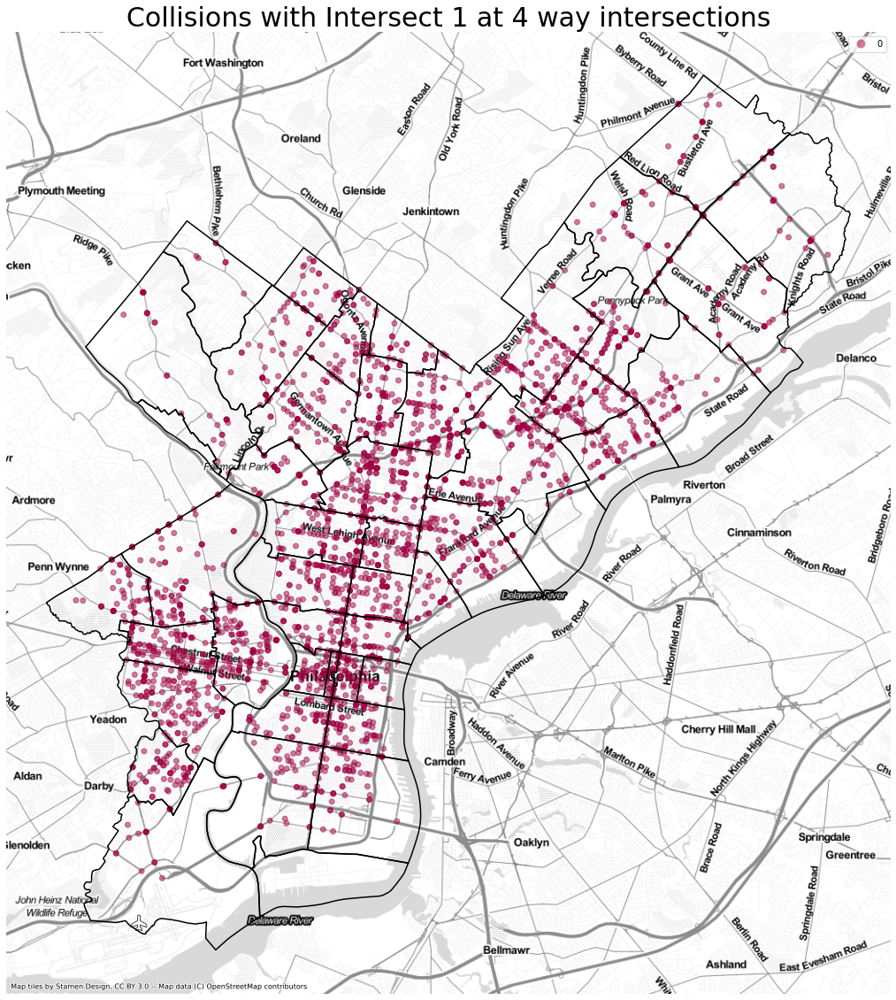

In [42]:
fig, ax = plt.subplots(1, 1,figsize=(20,20))
int0type1[(int0type1['crash_year']==2017)].to_crs(epsg=3857).plot(ax=ax,alpha=0.5,column='intersection', categorical=True, cmap='Spectral',legend=True)
#int0type1[(int0type1['crash_year']==2017) & (int0type1['CODE']=='19123')].to_crs(epsg=3857).plot(ax=ax,alpha=0.5,column='intersection', categorical=True, cmap='Spectral',legend=True)

#zipcode_boundaries[zipcode_boundaries['CODE']=='19123'].to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
ax.set_title('Collisions with Intersect 1 at 4 way intersections',fontsize='30');

For some reason it appears that the intersection value does not exist for the year 2017

In [178]:
dfintyear=data_geo.groupby(['intersection','crash_year']).crn.count().unstack().transpose()
dfintyear.to_markdown()


'|   crash_year |    0 |    1 |\n|-------------:|-----:|-----:|\n|         2013 | 2657 | 3991 |\n|         2014 | 2624 | 3784 |\n|         2015 | 2833 | 3898 |\n|         2016 | 2898 | 4286 |\n|         2017 | 6470 |  nan |'

Looking at the information for without the 2017 data it matches our expectations better.

In [44]:
dfint=data_geo[~(data_geo['crash_year']==2017)].groupby(['intersection','intersect_type']).crn.count().unstack().transpose()
dfint.index=dfint.index.map(intersect_map)
dfint=dfint.rename(columns={0:'NO',1:'YES'})
display(dfint)
print(dfint.sum())
print(dfint.sum().sum())

intersection,NO,YES
intersect_type,,
Mid-block,10979.0,NaN
Four way intersection,NaN,12062.0
T intersection,NaN,2699.0
Y intersection,NaN,450.0
Traffic circle or Round About,NaN,38.0
Multi-leg intersection,NaN,601.0
On ramp,NaN,69.0
Off ramp,NaN,36.0
Railroad crossing,NaN,4.0


intersection
NO     11012.0
YES    15959.0
dtype: float64
26971.0


To be able to work with the 2017 data (most recent) it is decided to drop the `intersection` feature

In [245]:
tcd_map={0:'Not applicable',
1:'Flashing traffic signal',
2:'Traffic signal',
3:'Stop sign',
4:'Yield sign',
5:'Active RR crossing controls',
6:'Passive RR crossing controls',
7:'Police officer or flagman',
8:'Other Type TCD',
9:'Unknown'}


gtemp=data_geo.groupby(['intersect_type','tcd_type']).crn.count().unstack()
gtemp.index=gtemp.index.map(intersect_map)
gtemp=gtemp.rename(columns=tcd_map)
gtemp.fillna(0)

tcd_type,Not applicable,Flashing traffic signal,Traffic signal,Stop sign,Yield sign,Active RR crossing controls,Passive RR crossing controls,Police officer or flagman,Other Type TCD,Unknown
intersect_type,,,,,,,,,,
Mid-block,12773.0,6.0,691.0,72.0,8.0,0.0,0.0,5.0,44.0,1.0
Four way intersection,752.0,74.0,10605.0,3512.0,26.0,0.0,0.0,3.0,5.0,6.0
T intersection,1094.0,11.0,1184.0,1042.0,6.0,0.0,0.0,1.0,4.0,0.0
Y intersection,185.0,1.0,214.0,141.0,13.0,0.0,0.0,0.0,2.0,1.0
Traffic circle or Round About,9.0,0.0,32.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0
Multi-leg intersection,13.0,3.0,686.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0
On ramp,40.0,0.0,2.0,7.0,33.0,0.0,0.0,0.0,0.0,0.0
Off ramp,34.0,0.0,2.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0
Railroad crossing,0.0,0.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0,0.0


Again it appears the we will not get any information from the `tcd_type.Unknown`, the `intersect_type.Other` and `intersect_type.NaN`.

In [46]:
data_geo.intersect_type.value_counts()

1     14983
0     13600
2      3342
5       740
3       557
6        82
4        47
10       44
7        40
9         5
11        1
Name: intersect_type, dtype: int64

In [258]:
roadcon_map={0:'Dry',
1:'Wet',
2:'Sand/ mud/ dirt/ oil/ or gravel',
3:'Snow covered',
4:'Slush',
5:'Ice',
6:'Ice Patches',
7:'Water',
8:'Other',
9:'Unknown (expired)'}
data_geo['road_con_desc']=data_geo.road_condition.map(roadcon_map)
road_con=data_geo.road_con_desc.value_counts().to_frame()
print(road_con.to_markdown())


|                                 |   road_con_desc |
|:--------------------------------|----------------:|
| Dry                             |           26821 |
| Wet                             |            5665 |
| Ice                             |             237 |
| Snow covered                    |             224 |
| Other                           |             164 |
| Ice Patches                     |             159 |
| Slush                           |             132 |
| Sand/ mud/ dirt/ oil/ or gravel |              21 |
| Water                           |              18 |


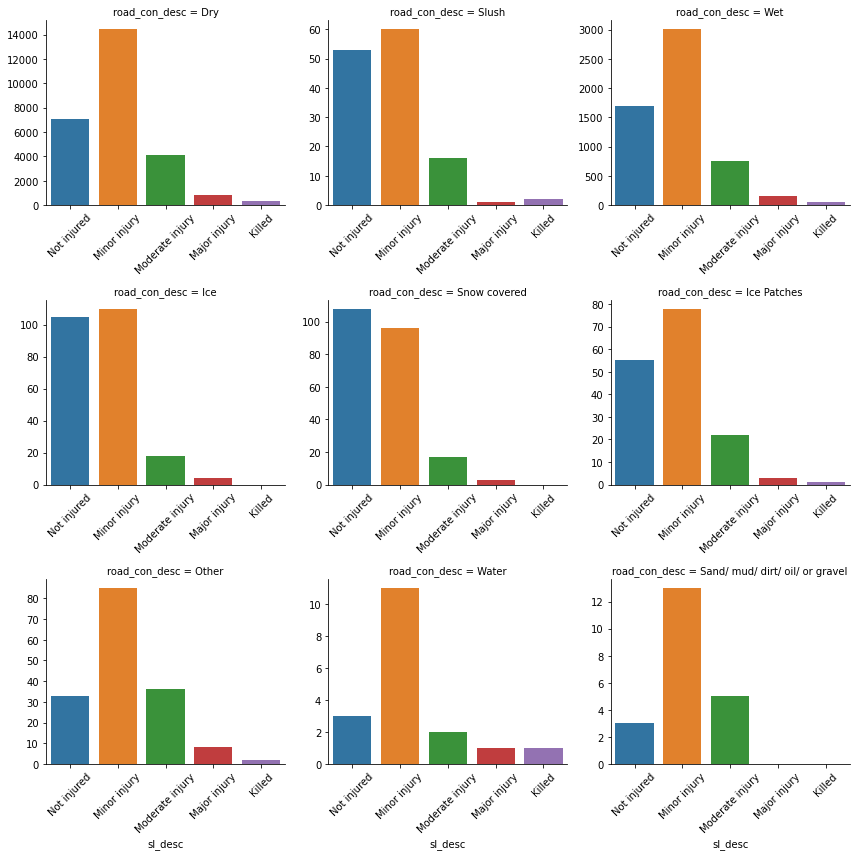

In [48]:
g=sns.FacetGrid(data_geo,col="road_con_desc", col_wrap=3, sharex=False, sharey=False, height=4, hue="sl_desc")
g.map(sns.countplot,"sl_desc",order=['Not injured','Minor injury','Moderate injury','Major injury','Killed']);
for ax in g.axes:
    for label in ax.get_xticklabels():
        label.set_rotation(45)
g.tight_layout()

For the road condition parameters it does appear that 'Wet conditions' increase the likelyhood of collisions. _Slush_ causes an increase in fatality vs major injury. Finally it appears that for as small as the _Water_ samples are there is a significant increase in the severity of the injuries.

In [49]:
topzc=(data_geo['CODE'].value_counts(normalize=True) * 100).to_frame().head(5)
topzc

,CODE
19140,5.573996
19124,5.307856
19104,4.189468
19143,4.126671
19134,3.932299


Almost a quarter of collisions occured in the top 5 zipcodes 

In [50]:
zc_score=data_geo['CODE'].value_counts(normalize=True) * 100

In [51]:
zipcode_boundaries['Incidents']=zipcode_boundaries.CODE.map(zc_score.to_dict())

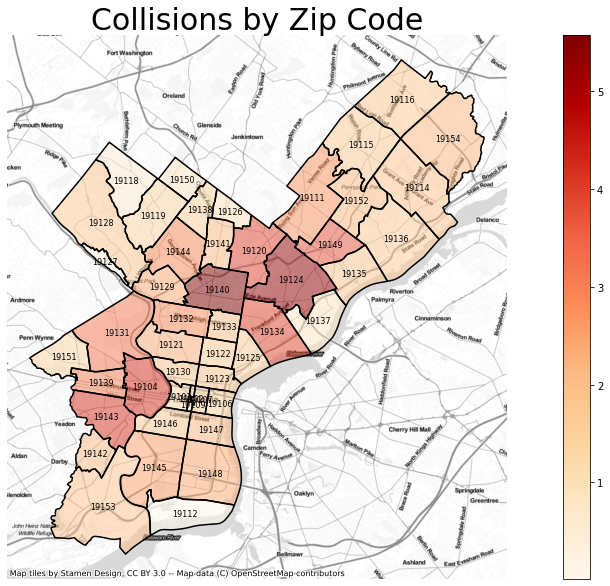

In [52]:
fig, ax = plt.subplots(1, 1,figsize=(20,10))
#int0type1[(int0type1['crash_year']==2017)].to_crs(epsg=3857).plot(ax=ax,alpha=0.5,column='intersection', categorical=True, cmap='Spectral',legend=True)
#int0type1[(int0type1['crash_year']==2017) & (int0type1['CODE']=='19123')].to_crs(epsg=3857).plot(ax=ax,alpha=0.5,column='intersection', categorical=True, cmap='Spectral',legend=True)

#zipcode_boundaries[zipcode_boundaries['CODE']=='19123'].to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
zipcode_boundaries.to_crs(epsg=3857).plot(ax=ax,column='Incidents',alpha=0.5,cmap='OrRd',legend=True)
zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
for l,name in zip(zipcode_boundaries.to_crs(epsg=3857).centroid,zipcode_boundaries.CODE):
    plt.text(l.x,l.y,name,ha='center', va='center',fontsize='8')
ax.set_axis_off()
ax.set_title('Collisions by Zip Code',fontsize='30');

It is interesting to note that the zipcodes with the highest number of collisions are not downtown as I would have expected. The top 2 contain parts of _Roosevelt Highway_, the 3 one is located in between college campuses and the last 2 seem to have large avenues.

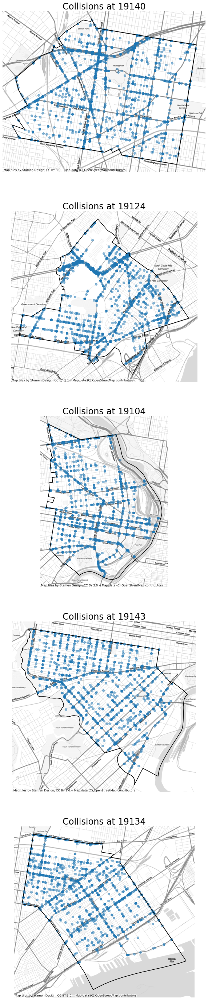

In [53]:
fig, axs = plt.subplots(5, 1,figsize=(10,50))
for i,zc in enumerate(topzc.index.values):
    ax=axs[i]
    data_geo[(data_geo['CODE']==zc)].to_crs(epsg=3857).plot(ax=ax,alpha=0.5,legend=True)
    zipcode_boundaries[zipcode_boundaries['CODE']==zc].to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
    ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
    ax.set_axis_off()
    ax.set_title('Collisions at {}'.format(zc),fontsize='24')
    

The zipcodes are quite general areas, if we generate a hexbin we can clearly see that the majority of the incidents occur on _Roosevelt Blvd_. With an additional concentration downtown.

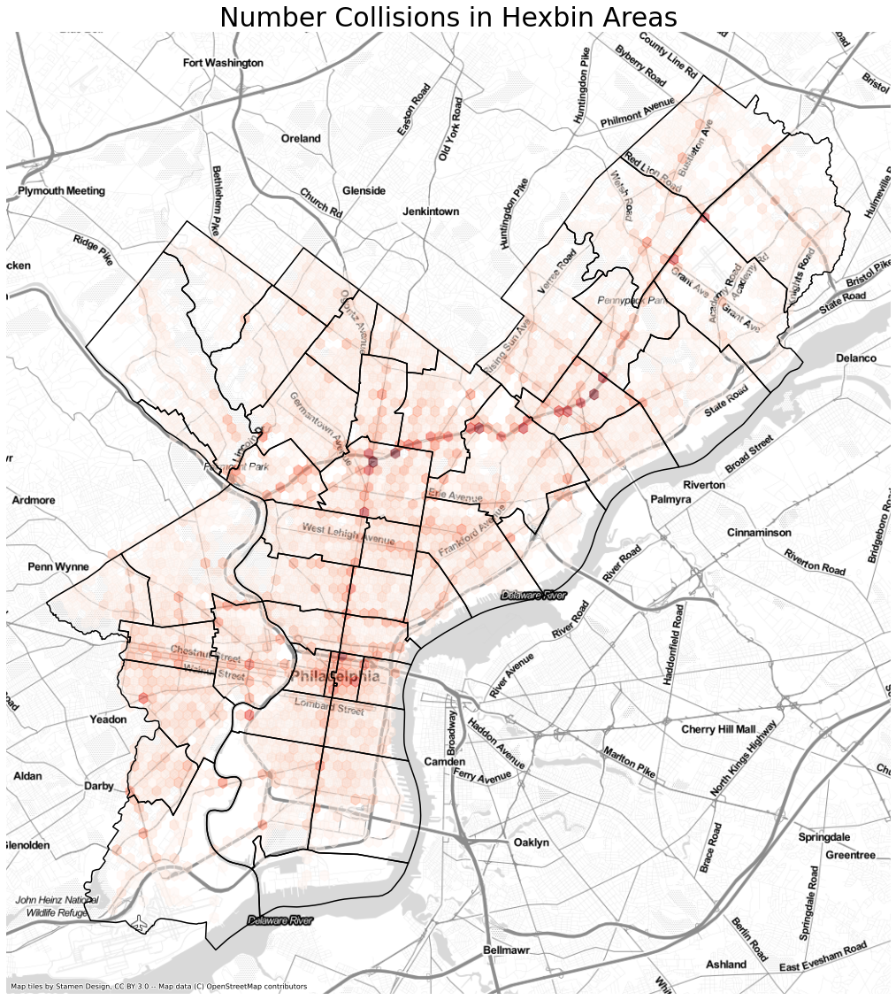

In [54]:
fig, ax = plt.subplots(1, 1,figsize=(20,20))

#zipcode_boundaries.to_crs(epsg=3857).plot(ax=ax,column='Incidents',alpha=0.5,cmap='OrRd',legend=True)
zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

ex=[ax.get_xlim()[0], ax.get_xlim()[1], ax.get_ylim()[0], ax.get_ylim()[1]]
conv_geo=data_geo.to_crs(epsg=3857)
hbs=ax.hexbin(conv_geo.geometry.x.values,conv_geo.geometry.y.values,mincnt=1, cmap='Reds', extent=ex, alpha=0.5)

ax.set_axis_off()
ax.set_title('Number Collisions in Hexbin Areas',fontsize='30');


If we just look at the individual locations that have the most collisions we can idenfity that the top 10 locations are mostly around _Roosevelt Blvd_ but there are also other locations with at the downtown area of _Race and Vine_ along with _Alegheny and Broad_.

In [55]:
bins_count=[]
for ccount, pos in zip(hbs.get_array(), hbs.get_offsets()):
    bins_count.append([ccount,pos[0],pos[1]])

bins_df=pd.DataFrame(bins_count,columns=['value','x','y'])

gdf = geopandas.GeoDataFrame(bins_df.value, geometry=geopandas.points_from_xy(bins_df.x, bins_df.y))

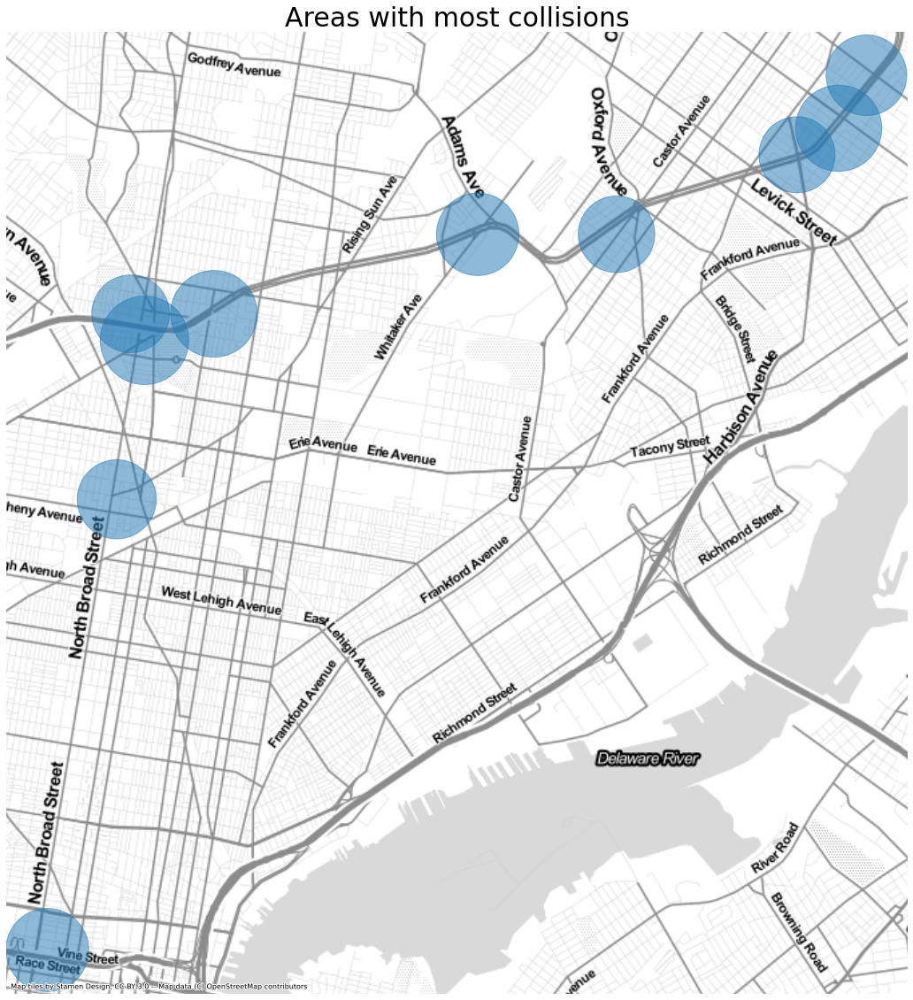

In [58]:
fig, ax = plt.subplots(1, 1,figsize=(20,20))
gdf.sort_values(by='value', ascending=False).head(10).plot(ax=ax, marker='o',alpha=0.5, markersize=gdf.sort_values(by='value', ascending=False).head(10).value.values*100)
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
ax.set_title('Areas with most collisions',fontsize='30');

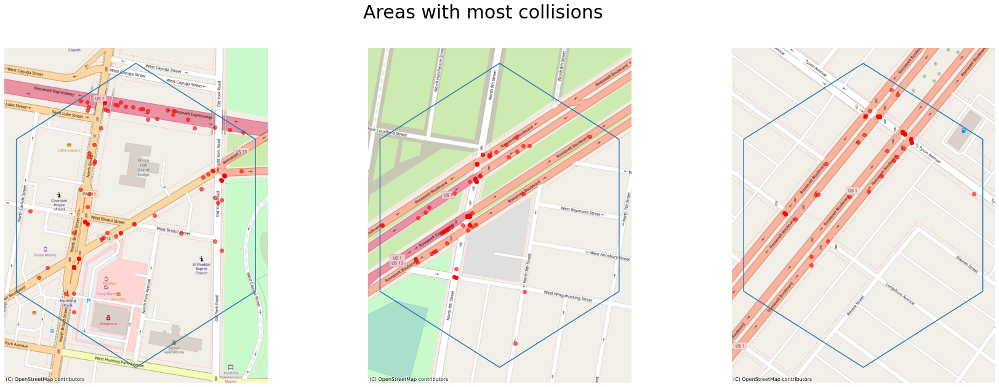

In [59]:
fig, axs = plt.subplots(1, 3,figsize=(30,10))
for i,(c,pt) in enumerate(gdf.sort_values(by='value', ascending=False).head(3).iterrows()):
    toploc=pt
    ax=axs[i]
    boundary=hbs.get_paths()[0].to_polygons()[0]+[toploc.values[1].x,toploc.values[1].y]

    g=geopandas.GeoSeries(Polygon(boundary))
    g.boundary.plot(ax=ax)

    data_geo[data_geo.to_crs(epsg=3857).within(Polygon(boundary))].to_crs(epsg=3857).plot(ax=ax,color='red',alpha=0.6)

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_axis_off()
fig.suptitle('Areas with most collisions',fontsize='30');

Since there does seem to be important information related to being on a highway or not (the top three are related to Roosevelt. Perhaps it will be important to provide that feature in our model. Or for further investigation use the created hexbins as features for the model.

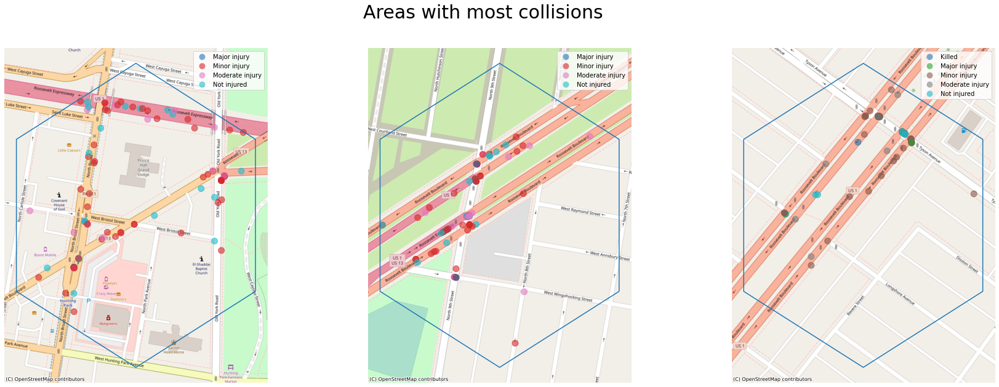

In [259]:
fig, axs = plt.subplots(1, 3,figsize=(30,10))
for i,(c,pt) in enumerate(gdf.sort_values(by='value', ascending=False).head(3).iterrows()):
    toploc=pt
    ax=axs[i]
    boundary=hbs.get_paths()[0].to_polygons()[0]+[toploc.values[1].x,toploc.values[1].y]

    g=geopandas.GeoSeries(Polygon(boundary))
    g.boundary.plot(ax=ax)

    data_geo[data_geo.to_crs(epsg=3857).within(Polygon(boundary))].to_crs(epsg=3857) \
    .plot(ax=ax,alpha=0.6, column='sl_desc', categorical=True, legend=True, markersize=100)

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_axis_off()
fig.suptitle('Areas with most collisions',fontsize='30');

However it does seem that most of the information wil be contained by the `intersect_type` feature.

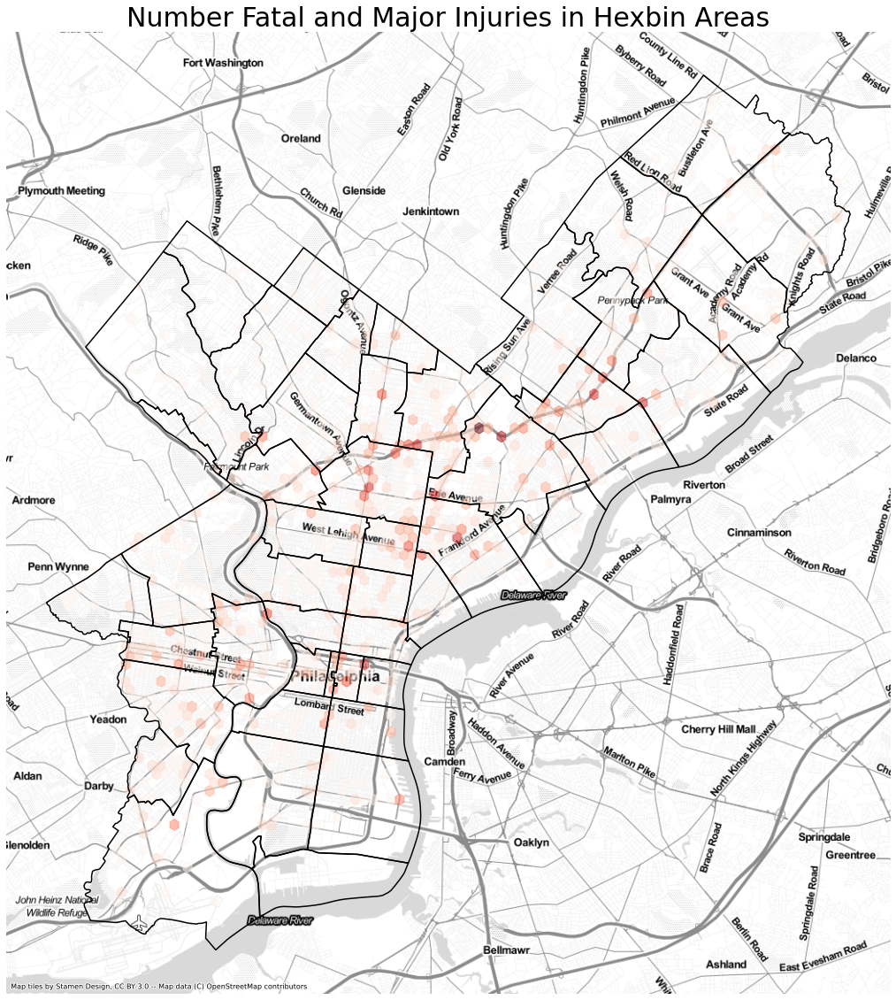

In [277]:
fig, ax = plt.subplots(1, 1,figsize=(20,20))

#zipcode_boundaries.to_crs(epsg=3857).plot(ax=ax,column='Incidents',alpha=0.5,cmap='OrRd',legend=True)
zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

ex=[ax.get_xlim()[0], ax.get_xlim()[1], ax.get_ylim()[0], ax.get_ylim()[1]]
conv_geo=data_geo[data_geo['max_severity_level'].isin([1,2])].to_crs(epsg=3857)
hbsf=ax.hexbin(conv_geo.geometry.x.values,conv_geo.geometry.y.values,mincnt=1, cmap='Reds', extent=ex, alpha=0.5)

ax.set_axis_off()
ax.set_title('Number Fatal and Major Injuries in Hexbin Areas',fontsize='30');


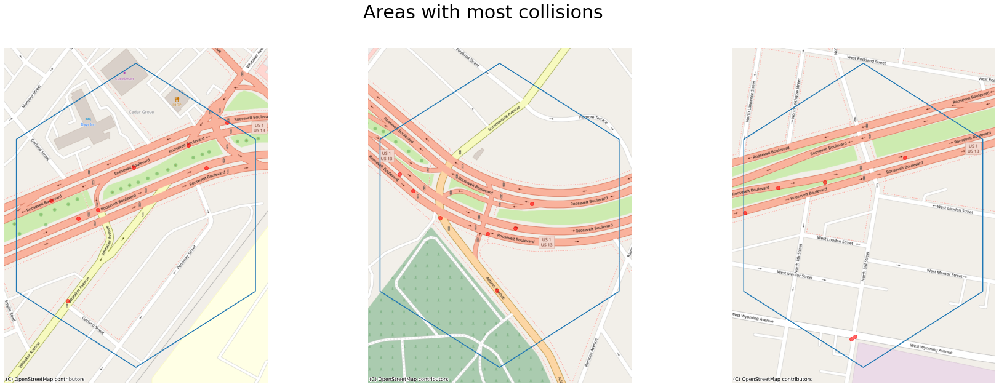

In [276]:
bins_count=[]
for ccount, pos in zip(hbsf.get_array(), hbsf.get_offsets()):
    bins_count.append([ccount,pos[0],pos[1]])

bins_df=pd.DataFrame(bins_count,columns=['value','x','y'])

gdf = geopandas.GeoDataFrame(bins_df.value, geometry=geopandas.points_from_xy(bins_df.x, bins_df.y))

fig, axs = plt.subplots(1, 3,figsize=(30,10))
for i,(c,pt) in enumerate(gdf.sort_values(by='value', ascending=False).head(3).iterrows()):
    toploc=pt
    ax=axs[i]
    boundary=hbsf.get_paths()[0].to_polygons()[0]+[toploc.values[1].x,toploc.values[1].y]

    g=geopandas.GeoSeries(Polygon(boundary))
    g.boundary.plot(ax=ax)

    data_geo[(data_geo['max_severity_level'].isin([1,2])) & (data_geo.to_crs(epsg=3857).within(Polygon(boundary)))].to_crs(epsg=3857).plot(ax=ax,color='red',alpha=0.6)

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_axis_off()
fig.suptitle('Areas with most collisions',fontsize='30');

In [61]:
data_geo[data_geo.to_crs(epsg=3857).within(Polygon(boundary))].to_crs(epsg=3857)

,crash_month,crash_year,crn,day_of_week,hour_of_day,illumination,intersect_type,intersection,max_severity_level,tcd_type,road_condition,geometry,sl_desc,index_right,CODE,il_desc,intersect_desc,road_con_desc
525,3,2017,2017041194,7,11,1,1,0,4,0,0,POINT (-8355518.528 4871829.376),Minor injury,22,19149,Daylight,Four way intersection,Dry
573,4,2017,2017036385,5,9,1,1,0,2,2,1,POINT (-8355474.000 4871800.295),Major injury,22,19149,Daylight,Four way intersection,Wet
744,3,2017,2017037551,7,16,1,1,0,4,2,1,POINT (-8355474.000 4871800.295),Minor injury,22,19149,Daylight,Four way intersection,Wet
818,2,2017,2017033558,7,17,3,1,0,3,2,1,POINT (-8355474.000 4871800.295),Moderate injury,22,19149,Dark - street lights,Four way intersection,Wet
836,5,2017,2017058337,6,23,3,1,0,4,2,1,POINT (-8355518.528 4871829.376),Minor injury,22,19149,Dark - street lights,Four way intersection,Wet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43501,11,2016,2016129477,5,11,1,1,1,0,2,0,POINT (-8355518.305 4871828.212),Not injured,22,19149,Daylight,Four way intersection,Dry
43689,11,2016,2016129967,6,18,3,1,1,0,2,0,POINT (-8355473.777 4871799.132),Not injured,22,19149,Dark - street lights,Four way intersection,Dry
44316,7,2016,2016080838,4,10,1,1,1,0,2,0,POINT (-8355473.777 4871799.132),Not injured,22,19149,Daylight,Four way intersection,Dry
44711,6,2016,2016070671,5,17,1,0,0,3,2,0,POINT (-8355629.624 4871595.570),Moderate injury,22,19149,Daylight,Mid-block,Dry


## Data Preparation
Now that we have an understanding of the data and have explored our variables we need to perform some data preparation to build our model. We also dropped the year since we want to focus on conditions, that are year independant.

In [62]:
data_prep=data_geo.drop(columns=['CODE','intersection','crash_year','geometry','index_right','sl_desc','road_con_desc','il_desc','intersect_desc'])
data_prep.tcd_type.replace(9,np.nan,inplace=True)
data_prep.tcd_type.replace(8,np.nan,inplace=True)
data_prep.hour_of_day.replace(99,np.nan,inplace=True)
data_prep.intersect_type.replace(11,np.nan,inplace=True)

In [63]:
data_prep.set_index('crn', inplace=True)

In [64]:
data_prep.describe()

,crash_month,day_of_week,hour_of_day,illumination,intersect_type,max_severity_level,tcd_type,road_condition
count,33441.000000,33441.000000,32001.000000,33441.000000,33440.000000,33441.000000,33378.000000,33441.000000
mean,6.666637,4.111330,12.817568,1.822075,0.851764,2.660596,1.254719,0.313507
std,3.367297,2.006781,6.224726,1.101045,1.067032,1.720199,1.183881,0.941107
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,2.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,4.000000,14.000000,1.000000,1.000000,4.000000,2.000000,0.000000
75%,10.000000,6.000000,18.000000,3.000000,1.000000,4.000000,2.000000,0.000000
max,12.000000,7.000000,23.000000,8.000000,10.000000,4.000000,7.000000,8.000000


In [65]:
missing_data = data_prep.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")  

crash_month
False    33441
Name: crash_month, dtype: int64

day_of_week
False    33441
Name: day_of_week, dtype: int64

hour_of_day
False    32001
True      1440
Name: hour_of_day, dtype: int64

illumination
False    33441
Name: illumination, dtype: int64

intersect_type
False    33440
True         1
Name: intersect_type, dtype: int64

max_severity_level
False    33441
Name: max_severity_level, dtype: int64

tcd_type
False    33378
True        63
Name: tcd_type, dtype: int64

road_condition
False    33441
Name: road_condition, dtype: int64



In [66]:
missing_data = data_prep.dropna().isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")

crash_month
False    31939
Name: crash_month, dtype: int64

day_of_week
False    31939
Name: day_of_week, dtype: int64

hour_of_day
False    31939
Name: hour_of_day, dtype: int64

illumination
False    31939
Name: illumination, dtype: int64

intersect_type
False    31939
Name: intersect_type, dtype: int64

max_severity_level
False    31939
Name: max_severity_level, dtype: int64

tcd_type
False    31939
Name: tcd_type, dtype: int64

road_condition
False    31939
Name: road_condition, dtype: int64



In [67]:
data_pros=pd.get_dummies(data_prep,columns=['crash_month', 'day_of_week', 'hour_of_day', 'illumination',
       'intersect_type', 'tcd_type', 'road_condition'])
data_pros.shape

(33441, 78)

In [68]:
target=data_pros.max_severity_level

In [69]:
X=data_pros.drop(columns=['max_severity_level'])

In [70]:
print(X.shape)
print(target.shape)

(33441, 77)
(33441,)


In [71]:
from sklearn.model_selection import train_test_split

In [300]:
X_train, X_test, y_train, y_test = train_test_split(X, target, test_size=0.3, random_state=3)

We also generate a balanced dataset by resampling with SMOTE

In [301]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
rs_X_train, rs_y_train = sm.fit_resample(X_train, y_train)

In [279]:
rs_y_train.to_frame().max_severity_level.value_counts()

4    12544
3    12544
2    12544
1    12544
0    12544
Name: max_severity_level, dtype: int64

In [74]:
feat_labels=data_pros.columns[1:]

### Prediction Model Creation

Since we are attmepting to create a multiclass classifier the first approach will be to 

In [308]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, f1_score, precision_score, accuracy_score
from sklearn.metrics import roc_curve, plot_roc_curve, auc
from sklearn.metrics import balanced_accuracy_score,make_scorer
from sklearn.metrics import precision_recall_fscore_support, recall_score
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix

In [76]:
def evaluate(y,y_hat,labels):
    cr=classification_report(y,y_hat,labels=labels, output_dict=True)
    #print(classification_report(y,y_hat,labels=labels))
    cm = confusion_matrix(y,y_hat,labels=labels)
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cmat = pd.DataFrame(cm)
    cmat.columns = labels
    cmat.set_index([pd.Index(labels)],inplace=True)
    #sns.heatmap(cmat, annot=True)
    #plt.title("Confusion Matrix")
    return cmat, cr

In [77]:
class_labels=[0,4,1,2,3]

In [78]:
balance_scorer=make_scorer(balanced_accuracy_score,adjusted=True)

### Decision Tree Classifier

In [302]:
decision_tree = DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_split=30)
decision_tree.fit(rs_X_train,rs_y_train);

In [303]:
y_hat_pred=decision_tree.predict(X_train)

cmat, cr =evaluate(y_train,y_hat_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)

print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.399078,0.574634,0.277778,0.044101,0.220000,0.496198,0.303118,0.454513
recall,0.269572,0.775829,0.019157,0.112835,0.019026,0.496198,0.239284,0.496198
f1-score,0.321784,0.660244,0.035842,0.063417,0.035023,0.496198,0.223262,0.449649
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.496198,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.269572,0.642646,0.000934,0.074864,0.011984
Minor injury,0.139190,0.775829,0.000399,0.073182,0.011400
Killed,0.360153,0.482759,0.019157,0.134100,0.003831
Major injury,0.235543,0.633286,0.000000,0.112835,0.018336
Moderate injury,0.173249,0.720669,0.000577,0.086480,0.019026


|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.4  |           0.57 |     0.28 |           0.04 |              0.22 |        0.5 |        0.3  |           0.45 |
| recall    |          0.27 |           0.78 |     0.02 |           0.11 |              0.02 |        0.5 |        0.24 |           0.5  |
| f1-score  |          0.32 |           0.66 |     0.04 |           0.06 |              0.04 |        0.5 |        0.22 |           0.45 |
| support   |       6425    |       12544    |   261    |         709    |           3469    |        0.5 |    23408    |       23408    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |
|:----------------|--------------:|---------------:|---------:|--

In [304]:
y_hat_test=decision_tree.predict(X_test)

cmat, cr =evaluate(y_test,y_hat_test,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)
print("Test score: {}".format(f1_score(y_test, y_hat_test, labels=class_labels, average='weighted')))

print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.383035,0.571707,0.0,0.036662,0.142857,0.487392,0.226852,0.431659
recall,0.267279,0.767967,0.0,0.089231,0.013324,0.487392,0.227560,0.487392
f1-score,0.314855,0.655461,0.0,0.051971,0.024375,0.487392,0.209332,0.440665
support,2720.000000,5357.000000,130.0,325.000000,1501.000000,0.487392,10033.000000,10033.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.267279,0.648529,0.002206,0.072426,0.009559
Minor injury,0.142430,0.767967,0.000187,0.073549,0.015867
Killed,0.338462,0.507692,0.000000,0.138462,0.015385
Major injury,0.273846,0.612308,0.003077,0.089231,0.021538
Moderate injury,0.183211,0.701532,0.000000,0.101932,0.013324


Test score: 0.44066453205060707
|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.38 |           0.57 |        0 |           0.04 |              0.14 |       0.49 |        0.23 |           0.43 |
| recall    |          0.27 |           0.77 |        0 |           0.09 |              0.01 |       0.49 |        0.23 |           0.49 |
| f1-score  |          0.31 |           0.66 |        0 |           0.05 |              0.02 |       0.49 |        0.21 |           0.44 |
| support   |       2720    |        5357    |      130 |         325    |           1501    |       0.49 |    10033    |       10033    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |
|:----------------|--------------

## Random Forest

In [281]:
random_forest = RandomForestClassifier(n_estimators=1000,min_samples_split=5, n_jobs=-1, random_state=31)
random_forest.fit(X_train, y_train)

y_hat_pred=random_forest.predict(X_train)

cmat, cr =evaluate(y_train,y_hat_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.763046,0.725439,0.969697,0.930380,0.821406,0.742353,0.841994,0.758915
recall,0.644047,0.937739,0.122605,0.207334,0.373883,0.742353,0.457122,0.742353
f1-score,0.698515,0.818040,0.217687,0.339100,0.513867,0.742353,0.517442,0.718954
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.742353,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.644047,0.338054,0.000000,0.000311,0.017588
Minor injury,0.052216,0.937739,0.000000,0.000717,0.009327
Killed,0.272031,0.551724,0.122605,0.000000,0.053640
Major injury,0.188999,0.548660,0.001410,0.207334,0.053597
Moderate injury,0.122514,0.503603,0.000000,0.000000,0.373883


In [85]:
random_forest = RandomForestClassifier(n_estimators=1000, n_jobs=-1, random_state=31)

parameters={'max_depth':[3,5,10,None],'min_samples_split':[5,10,15,None]}

grid_search=GridSearchCV(random_forest,parameters, n_jobs=-1,cv=3, scoring='accuracy_score')
grid_search.fit(X_train, y_train)

grid_search.best_params_
best_e=grid_search.best_estimator_

y_hat_pred=best_e.predict(X_train)

cmat, cr =evaluate(y_train,y_hat_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Train score: {}".format(f1_score(y_train, y_hat_pred, labels=class_labels, average='weighted')))

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.763046,0.725439,0.969697,0.930380,0.821406,0.742353,0.841994,0.758915
recall,0.644047,0.937739,0.122605,0.207334,0.373883,0.742353,0.457122,0.742353
f1-score,0.698515,0.818040,0.217687,0.339100,0.513867,0.742353,0.517442,0.718954
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.742353,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.644047,0.338054,0.000000,0.000311,0.017588
Minor injury,0.052216,0.937739,0.000000,0.000717,0.009327
Killed,0.272031,0.551724,0.122605,0.000000,0.053640
Major injury,0.188999,0.548660,0.001410,0.207334,0.053597
Moderate injury,0.122514,0.503603,0.000000,0.000000,0.373883


CV best score: 0.4389368227924067
Train score: 0.7189544947679034


In [ ]:
random_forest = RandomForestClassifier(n_estimators=1000, n_jobs=-1)

parameters={'max_depth':[3,5,10,None],'min_samples_split':[5,10,15,None]}

grid_search=GridSearchCV(random_forest,parameters, n_jobs=-1,cv=3, scoring='accuracy')
grid_search.fit(rs_X_train, rs_y_train)

grid_search.best_params_
best_e=grid_search.best_estimator_

In [307]:
y_hat_pred=best_e.predict(X_train)

cmat, cr =evaluate(y_train,y_hat_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

In [312]:
display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Train score: {}".format(accuracy_score(y_train, y_hat_pred)))
print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.752911,0.760508,0.641509,0.652068,0.677407,0.747052,0.696881,0.741496
recall,0.674397,0.882733,0.260536,0.377997,0.503027,0.747052,0.539738,0.747052
f1-score,0.711494,0.817075,0.370572,0.478571,0.577337,0.747052,0.591010,0.737335
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.747052,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.674397,0.275331,0.003113,0.006537,0.040623
Minor injury,0.070472,0.882733,0.000877,0.006218,0.039700
Killed,0.237548,0.413793,0.260536,0.011494,0.076628
Major injury,0.131171,0.414669,0.002821,0.377997,0.073343
Moderate injury,0.110406,0.379360,0.001441,0.005765,0.503027


CV best score: 0.6867192117426248
Train score: 0.7470522898154477
|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.75 |           0.76 |     0.64 |           0.65 |              0.68 |       0.75 |        0.7  |           0.74 |
| recall    |          0.67 |           0.88 |     0.26 |           0.38 |              0.5  |       0.75 |        0.54 |           0.75 |
| f1-score  |          0.71 |           0.82 |     0.37 |           0.48 |              0.58 |       0.75 |        0.59 |           0.74 |
| support   |       6425    |       12544    |   261    |         709    |           3469    |       0.75 |    23408    |       23408    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |

In [313]:
best_accuracy_rf=best_e

In [88]:
y_hat_test=best_e.predict(X_test)

cmat, cr =evaluate(y_test,y_hat_test,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Test score: {}".format(f1_score(y_test, y_hat_test, labels=class_labels, average='weighted')))

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.340407,0.553520,0.0,0.009524,0.138850,0.469152,0.208460,0.408913
recall,0.283088,0.716259,0.0,0.003077,0.065956,0.469152,0.213676,0.469152
f1-score,0.309113,0.624461,0.0,0.004651,0.089431,0.469152,0.205531,0.430756
support,2720.000000,5357.000000,130.0,325.000000,1501.000000,0.469152,10033.000000,10033.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.283088,0.638235,0.003309,0.011029,0.064338
Minor injury,0.197125,0.716259,0.001680,0.010267,0.074669
Killed,0.330769,0.561538,0.000000,0.007692,0.100000
Major injury,0.236923,0.673846,0.006154,0.003077,0.080000
Moderate injury,0.210526,0.710859,0.000666,0.011992,0.065956


CV best score: 0.6724691592498351
Test score: 0.4307556338202392


Even using the random classifier, with an upsampled dataset we do not perform much better on the test data.
Because of this we try to optimize in regards to the recall of the data. 

In [314]:
random_forest = RandomForestClassifier(n_estimators=1000, n_jobs=-1)

parameters={'max_depth':[3,5,10,None],'min_samples_split':[5,10,15,None]}

grid_search=GridSearchCV(random_forest,parameters, n_jobs=-1,cv=3, scoring='recall_weighted')
grid_search.fit(rs_X_train, rs_y_train)

grid_search.best_params_
best_rf_recall=grid_search.best_estimator_

y_hat_pred=best_e.predict(X_train)

cmat, cr =evaluate(y_train,y_hat_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

In [315]:
display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Train recall score: {}".format(recall_score(y_train, y_hat_pred, labels=class_labels, average='weighted')))

print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.752911,0.760508,0.641509,0.652068,0.677407,0.747052,0.696881,0.741496
recall,0.674397,0.882733,0.260536,0.377997,0.503027,0.747052,0.539738,0.747052
f1-score,0.711494,0.817075,0.370572,0.478571,0.577337,0.747052,0.591010,0.737335
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.747052,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.674397,0.275331,0.003113,0.006537,0.040623
Minor injury,0.070472,0.882733,0.000877,0.006218,0.039700
Killed,0.237548,0.413793,0.260536,0.011494,0.076628
Major injury,0.131171,0.414669,0.002821,0.377997,0.073343
Moderate injury,0.110406,0.379360,0.001441,0.005765,0.503027


CV best score: 0.6868467683557462
Train recall score: 0.7470522898154477
|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.75 |           0.76 |     0.64 |           0.65 |              0.68 |       0.75 |        0.7  |           0.74 |
| recall    |          0.67 |           0.88 |     0.26 |           0.38 |              0.5  |       0.75 |        0.54 |           0.75 |
| f1-score  |          0.71 |           0.82 |     0.37 |           0.48 |              0.58 |       0.75 |        0.59 |           0.74 |
| support   |       6425    |       12544    |   261    |         709    |           3469    |       0.75 |    23408    |       23408    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate i

In [94]:
y_hat_test=best_e_recall.predict(X_test)

cmat, cr =evaluate(y_test,y_hat_test,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Test recall score: {}".format(recall_score(y_test, y_hat_test, labels=class_labels, average='weighted')))

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.340728,0.553844,0.0,0.009091,0.136752,0.46965,0.208083,0.408845
recall,0.282353,0.718126,0.0,0.003077,0.063957,0.46965,0.213503,0.469650
f1-score,0.308806,0.625376,0.0,0.004598,0.087154,0.46965,0.205187,0.430819
support,2720.000000,5357.000000,130.0,325.000000,1501.000000,0.46965,10033.000000,10033.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.282353,0.638603,0.003309,0.011029,0.064706
Minor injury,0.196565,0.718126,0.001680,0.010827,0.072802
Killed,0.323077,0.561538,0.000000,0.015385,0.100000
Major injury,0.227692,0.680000,0.006154,0.003077,0.083077
Moderate injury,0.211193,0.711526,0.000666,0.012658,0.063957


CV best score: 0.684200108576792
Test recall score: 0.4696501544901824


Again the recall is not great on the test data, and the _Fatalities_ are not being detected at all.

## KNN Classifier

In [316]:
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier()
knn_classifier.fit(rs_X_train, rs_y_train)

knn_pred = knn_classifier.predict(X_train)

cmat, cr =evaluate(y_train,knn_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)
print("CV best score: {}".format(grid_search.best_score_))
print("Train score: {}".format(f1_score(y_train, knn_pred, labels=class_labels, average='weighted')))

print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.511521,0.697292,0.400000,0.456140,0.424920,0.606801,0.497975,0.595318
recall,0.590817,0.736926,0.084291,0.110014,0.306717,0.606801,0.365753,0.606801
f1-score,0.548317,0.716561,0.139241,0.177273,0.356270,0.606801,0.387532,0.594216
support,6425.000000,12544.000000,261.000000,709.000000,3469.000000,0.606801,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.590817,0.340856,0.001089,0.003424,0.063813
Minor injury,0.183753,0.736926,0.001355,0.004385,0.073581
Killed,0.390805,0.402299,0.084291,0.011494,0.111111
Major injury,0.307475,0.466855,0.005642,0.110014,0.110014
Moderate injury,0.288268,0.399827,0.001441,0.003747,0.306717


CV best score: 0.6868467683557462
Train score: 0.5942161763668082
|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.51 |           0.7  |     0.4  |           0.46 |              0.42 |       0.61 |        0.5  |           0.6  |
| recall    |          0.59 |           0.74 |     0.08 |           0.11 |              0.31 |       0.61 |        0.37 |           0.61 |
| f1-score  |          0.55 |           0.72 |     0.14 |           0.18 |              0.36 |       0.61 |        0.39 |           0.59 |
| support   |       6425    |       12544    |   261    |         709    |           3469    |       0.61 |    23408    |       23408    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |

## XGBOOST

In [317]:
from xgboost import XGBClassifier
from sklearn.multiclass import OneVsRestClassifier

xgb_classifier = OneVsRestClassifier(XGBClassifier())
xgb_classifier.fit(rs_X_train, rs_y_train)

y_xgb_pred=xgb_classifier.predict(X_train)

cmat, cr =evaluate(y_train,y_xgb_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)

print("Train score: {}".format(f1_score(y_train, y_xgb_pred, labels=class_labels, average='weighted')))
print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

D:\DevCode\Envs\GeoSP\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.493325,0.568682,0.0,0.333333,0.672727,0.558527,0.413614,0.549948
recall,0.247315,0.912548,0.0,0.001410,0.010666,0.558527,0.234388,0.558527
f1-score,0.329463,0.700701,0.0,0.002809,0.020999,0.558527,0.210794,0.469123
support,6425.000000,12544.000000,261.0,709.000000,3469.000000,0.558527,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.247315,0.751284,0.0,0.000000,0.001401
Minor injury,0.086655,0.912548,0.0,0.000080,0.000717
Killed,0.226054,0.773946,0.0,0.000000,0.000000
Major injury,0.153738,0.844852,0.0,0.001410,0.000000
Moderate injury,0.108677,0.880369,0.0,0.000288,0.010666


Train score: 0.4691228742581956
|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.49 |           0.57 |        0 |           0.33 |              0.67 |       0.56 |        0.41 |           0.55 |
| recall    |          0.25 |           0.91 |        0 |           0    |              0.01 |       0.56 |        0.23 |           0.56 |
| f1-score  |          0.33 |           0.7  |        0 |           0    |              0.02 |       0.56 |        0.21 |           0.47 |
| support   |       6425    |       12544    |      261 |         709    |           3469    |       0.56 |    23408    |       23408    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |
|:----------------|--------------

In [98]:
from sklearn.svm import SVC
svm_classifier = SVC(kernel='rbf')
svm_classifier.fit(rs_X_train, rs_y_train)

y_SVM_pred = svm_classifier.predict(X_train)


cmat, cr =evaluate(y_train,y_SVM_pred,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)

print("Train score: {}".format(f1_score(y_train, y_SVM_pred, labels=class_labels, average='weighted')))

D:\DevCode\Envs\GeoSP\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.0,0.535885,0.0,0.0,0.0,0.535885,0.107177,0.287173
recall,0.0,1.000000,0.0,0.0,0.0,0.535885,0.200000,0.535885
f1-score,0.0,0.697819,0.0,0.0,0.0,0.535885,0.139564,0.373951
support,6425.0,12544.000000,261.0,709.0,3469.0,0.535885,23408.000000,23408.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.0,1.0,0.0,0.0,0.0
Minor injury,0.0,1.0,0.0,0.0,0.0
Killed,0.0,1.0,0.0,0.0,0.0
Major injury,0.0,1.0,0.0,0.0,0.0
Moderate injury,0.0,1.0,0.0,0.0,0.0


Train score: 0.37395102028648514


In [ ]:
print(hello)

In [323]:
y_hat_test=best_rf_recall.predict(X_test)

In [325]:
cmat, cr =evaluate(y_test,y_hat_test,class_labels)
res=pd.DataFrame.from_dict(cr)
res.columns=[sl_str_map.get(x,x) for x in res.columns.values]

cmat.columns=[sl_map.get(x,x) for x in cmat.columns.values]
cmat.index=[sl_map.get(x,x) for x in cmat.index.values]

display(res)
display(cmat)

print(res.applymap('{:.2f}'.format).to_markdown())
print(cmat.applymap('{:.2f}'.format).to_markdown())

,Not injured,Minor injury,Killed,Major injury,Moderate injury,accuracy,macro avg,weighted avg
precision,0.341593,0.555171,0.0,0.008772,0.150142,0.471245,0.211135,0.411781
recall,0.283824,0.718499,0.0,0.003077,0.070620,0.471245,0.215204,0.471245
f1-score,0.310040,0.626363,0.0,0.004556,0.096058,0.471245,0.207403,0.433011
support,2720.000000,5357.000000,130.0,325.000000,1501.000000,0.471245,10033.000000,10033.000000


,Not injured,Minor injury,Killed,Major injury,Moderate injury
Not injured,0.283824,0.634191,0.004044,0.011765,0.066176
Minor injury,0.197499,0.718499,0.001120,0.011387,0.071495
Killed,0.292308,0.592308,0.000000,0.015385,0.100000
Major injury,0.227692,0.689231,0.006154,0.003077,0.073846
Moderate injury,0.211859,0.704863,0.000666,0.011992,0.070620


|           |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |   accuracy |   macro avg |   weighted avg |
|:----------|--------------:|---------------:|---------:|---------------:|------------------:|-----------:|------------:|---------------:|
| precision |          0.34 |           0.56 |        0 |           0.01 |              0.15 |       0.47 |        0.21 |           0.41 |
| recall    |          0.28 |           0.72 |        0 |           0    |              0.07 |       0.47 |        0.22 |           0.47 |
| f1-score  |          0.31 |           0.63 |        0 |           0    |              0.1  |       0.47 |        0.21 |           0.43 |
| support   |       2720    |        5357    |      130 |         325    |           1501    |       0.47 |    10033    |       10033    |
|                 |   Not injured |   Minor injury |   Killed |   Major injury |   Moderate injury |
|:----------------|--------------:|---------------:|---------:|--

In [114]:
res_disp=X_test.join(data_geo[['crn','geometry','max_severity_level']].set_index('crn'), on='crn', how='left')

In [113]:
y_test

array([4, 4, 4, ..., 4, 3, 4], dtype=int64)

In [117]:
res_disp['max_severity_predicted']=y_hat_test

In [128]:
res_disp[['geometry','max_severity_level','max_severity_predicted']]
res_disp['check']=res_disp.apply(lambda x: 1 if x.max_severity_level==x.max_severity_predicted else 0, axis=1)

misspt=res_disp[res_disp['check']==0]
correctpt=res_disp[res_disp['check']==1]

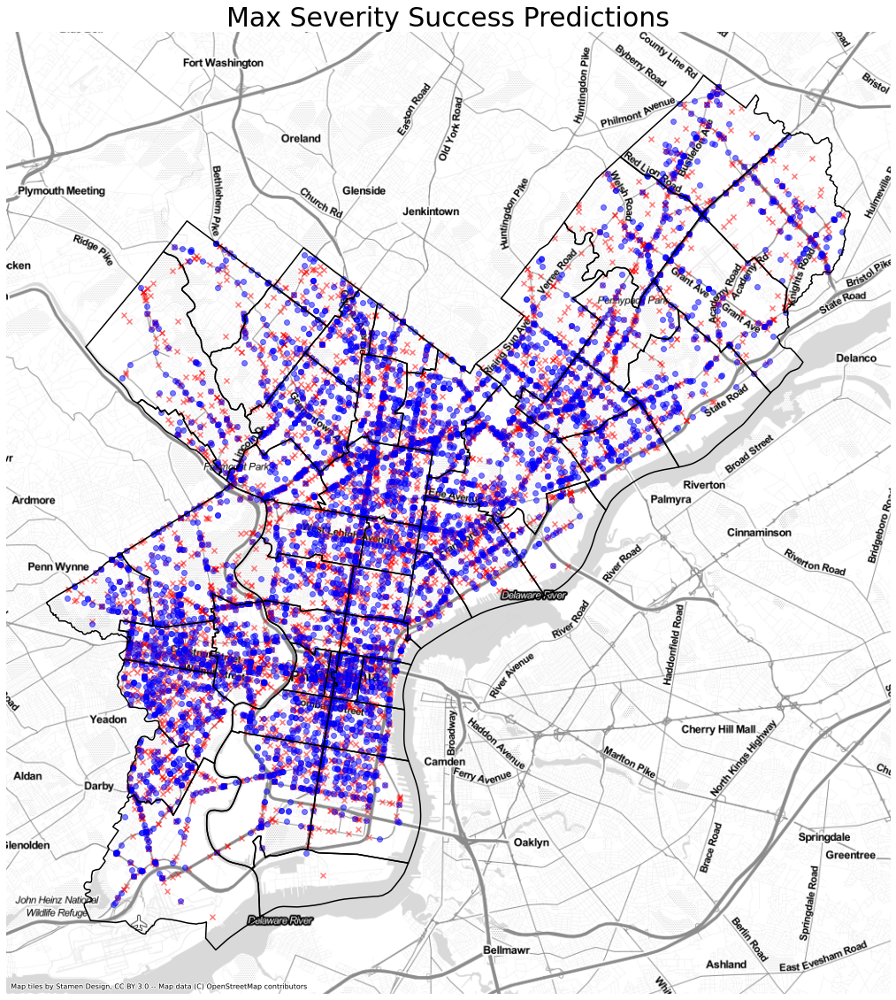

In [134]:
fig, ax = plt.subplots(1, 1,figsize=(20,20))

#zipcode_boundaries.to_crs(epsg=3857).plot(ax=ax,column='Incidents',alpha=0.5,cmap='OrRd',legend=True)
zipcode_boundaries.to_crs(epsg=3857).boundary.plot(ax=ax, color='k')
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

misspt.to_crs(epsg=3857).plot(ax=ax, marker='x', color='r', alpha=0.5)
correctpt.to_crs(epsg=3857).plot(ax=ax, marker='o', color='b', alpha=0.5)

ax.set_axis_off()
ax.set_title('Max Severity Success Predictions',fontsize='30');

In [142]:
importances = best_rf_recall.feature_importances_
std = np.std([tree.feature_importances_ for tree in best_rf_recall.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
imps=[]
for f in range(X.shape[1]):
    print("%d. feature %d %s (%f)" % (f + 1, indices[f],feat_labels[indices[f]],importances[indices[f]]))
    imps.append([feat_labels[indices[f]],importances[indices[f]]])

Feature ranking:
1. feature 17 day_of_week_6 (0.031454)
2. feature 18 day_of_week_7 (0.030511)
3. feature 12 day_of_week_1 (0.029940)
4. feature 13 day_of_week_2 (0.028984)
5. feature 15 day_of_week_4 (0.027964)
6. feature 16 day_of_week_5 (0.027928)
7. feature 14 day_of_week_3 (0.027313)
8. feature 4 crash_month_5 (0.025608)
9. feature 9 crash_month_10 (0.025403)
10. feature 7 crash_month_8 (0.024292)
11. feature 8 crash_month_9 (0.024010)
12. feature 10 crash_month_11 (0.023966)
13. feature 3 crash_month_4 (0.023818)
14. feature 5 crash_month_6 (0.022884)
15. feature 2 crash_month_3 (0.022456)
16. feature 6 crash_month_7 (0.022413)
17. feature 11 crash_month_12 (0.021346)
18. feature 69 road_condition_1 (0.020903)
19. feature 1 crash_month_2 (0.020560)
20. feature 37 hour_of_day_18.0 (0.019910)
21. feature 36 hour_of_day_17.0 (0.019505)
22. feature 51 intersect_type_1.0 (0.018880)
23. feature 0 crash_month_1 (0.018860)
24. feature 35 hour_of_day_16.0 (0.018388)
25. feature 52 interse

In [157]:
imp_df=pd.DataFrame(imps, columns=['feat','imp'])

In [163]:
imp_df.feat.replace('[^a-zA-Z]','',regex=True,inplace=True)

In [329]:
print(imp_df.groupby('feat').sum().sort_values(by='imp', ascending=False).applymap('{:.2f}'.format).to_markdown())

| feat          |   imp |
|:--------------|------:|
| hourofday     |  0.31 |
| crashmonth    |  0.28 |
| dayofweek     |  0.2  |
| intersecttype |  0.07 |
| tcdtype       |  0.05 |
| roadcondition |  0.05 |
| illumination  |  0.04 |
